In [1]:
import matplotlib.pyplot as plt
import numpy as np
import numpy as np
from tqdm import tqdm
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from continuum import ClassIncremental
from continuum.datasets import CIFAR100, CIFAR10
from continuum.tasks import split_train_val

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Load CIFAR-10 dataset
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

dataset = CIFAR100("my/data/path", download=True, train=True)

# Define the class-incremental scenario
scenario = ClassIncremental(
    dataset,
    increment=10,  # Add 2 new classes per task
    initial_increment=10  # Start with 2 classes
)

print(f"Number of classes: {scenario.nb_classes}.")
print(f"Number of tasks: {scenario.nb_tasks}.")

# Define the NN model
class NN(nn.Module):
    def __init__(self, layer_sizes):
        super(NN, self).__init__()
        self.linears = nn.ModuleList()
        for i in range(len(layer_sizes) - 1):
            m = nn.Linear(layer_sizes[i], layer_sizes[i + 1])
            self.linears.append(m)
        
    def forward(self, x):
        x = x.view(x.size(0), -1) 
        for linear in self.linears[:-1]:
            x = torch.tanh(linear(x))
        x = self.linears[-1](x)
        return x

# Function to calculate accuracy
def calculate_accuracy(outputs, labels):
    preds = torch.argmax(outputs, dim=1)  # Get the predicted class
    correct = (preds == labels).float().sum()
    accuracy = correct / len(labels)
    return accuracy.item()

# Function to calculate NTK (based on simrnn_ntk)
def simrnn_ntk(inputseqs, model):
    grads = []
    for seq in inputseqs:
        model.zero_grad()  # Clear previous gradients
        out = model(seq.unsqueeze(0).to(device))  # Add batch dimension and move to GPU
        # Ensure output is a scalar for backward()
        if out.dim() > 0:
            out = out.sum()
        out.backward()  # Compute gradients
        # Collect gradients for all parameters
        grad = torch.cat([p.grad.flatten() if p.grad is not None else torch.zeros_like(p).flatten()
                          for p in model.parameters()])
        grads.append(grad)
    
    batchsize = len(inputseqs)
    ntk = torch.zeros(batchsize, batchsize, device=device)
    for i in range(batchsize):
        for j in range(0, i+1):
            ntk[i, j] = ntk[j, i] = torch.dot(grads[i], grads[j])
    return ntk.cpu().numpy()  # Move NTK matrix back to CPU for plotting

# Function to evaluate the model on a dataset
def evaluate(model, loader, criterion):
    model.eval()
    total_loss = 0.0
    total_accuracy = 0.0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for x, y, _ in loader:
            x, y = x.to(device), y.to(device)  # Move data to GPU
            outputs = model(x)
            loss = criterion(outputs, y)
            total_loss += loss.item()
            _, pred = torch.max(outputs, 1)
            correct += (pred == y).sum().item()
            total += y.size(0)
    return total_loss / len(loader), correct / total

# Lists to store fixed samples and validation tasksets
fixed_train_samples = []
fixed_val_samples = []
val_tasksets = []
train_tasksets = []

# Function to extract fixed samples and validation tasksets
def extract_fixed_samples_and_tasksets(scenario):
    for task_id, train_taskset in enumerate(scenario):
        # Split the taskset into training and validation sets
        train_taskset, val_taskset = split_train_val(train_taskset, val_split=0.1)
        
        # Store fixed samples for NTK calculation
        fixed_train_samples.append([train_taskset[i][0].to(device) for i in range(10)])  # Move to GPU
        fixed_val_samples.append([val_taskset[i][0].to(device) for i in range(10)])  # Move to GPU
        
        # Store validation taskset
        val_tasksets.append(val_taskset)
        train_tasksets.append(train_taskset)

# Function to train, evaluate, and plot NTK metrics
def train_and_evaluate(model, epochs_per_task):
    num_tasks = len(val_tasksets)
    total_epochs = num_tasks * epochs_per_task

    # Initialize lists to store results
    train_losses = []
    val_losses = []
    train_accuracies = []
    val_accuracies = []
    task_accuracies = [[] for _ in range(num_tasks)]  # Accuracy on all tasks after each epoch
    train_ntk_matrices = [[] for _ in range(num_tasks)]
    test_ntk_matrices = [[] for _ in range(num_tasks)]

    # Train and evaluate on each task
    for task_id in range(num_tasks):
        print(f"\n=== Task {task_id + 1} ===")
        
        train_loader = DataLoader(train_tasksets[task_id], batch_size=32, shuffle=True)
        val_loader = DataLoader(val_tasksets[task_id], batch_size=32, shuffle=False)
        
        # Train the model on the current task
        model.train()
        for epoch in range(epochs_per_task):
            global_epoch = task_id * epochs_per_task + epoch  # Global epoch index
            running_loss = 0.0
            running_accuracy = 0.0
            correct = 0
            total = 0
            for x, y, t in train_loader:
                x, y = x.to(device), y.to(device)  # Move data to GPU
                optimizer.zero_grad()
                outputs = model(x)
                loss = criterion(outputs, y)
                loss.backward()
                optimizer.step()
                running_loss += loss.item()
                _, pred = torch.max(outputs, 1)
                correct += (pred == y).sum().item()
                total += y.size(0)
            
            train_loss = running_loss / len(train_loader)
            train_accuracy = correct / total
            train_losses.append(train_loss)
            train_accuracies.append(train_accuracy)

            # Evaluate on the validation set
            val_loss, val_accuracy = evaluate(model, val_loader, criterion)
            val_losses.append(val_loss)
            val_accuracies.append(val_accuracy)

            print(f"Epoch {global_epoch + 1}, "
                  f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
                  f"Train Accuracy: {train_accuracy:.4f}, Val Accuracy: {val_accuracy:.4f}")

            # Calculate NTK for fixed samples at the end of each epoch
            model.eval()
            for t in range(task_id + 1):
                train_ntk = simrnn_ntk(fixed_train_samples[t], model)
                test_ntk = simrnn_ntk(fixed_val_samples[t], model)
                train_ntk_matrices[t].append(train_ntk)
                test_ntk_matrices[t].append(test_ntk)

            # Evaluate the model on all tasks seen so far using fixed validation sets
            for t in range(task_id + 1):
                val_loader_t = DataLoader(val_tasksets[t], batch_size=32, shuffle=False)
                _, accuracy = evaluate(model, val_loader_t, criterion)
                task_accuracies[t].append(accuracy)
                print(f"Accuracy on Task {t + 1} at Epoch {global_epoch + 1}: {accuracy:.4f}")

    def calculate_ntk_metrics(ntk_matrices):
        norms = []
        max_eigenvalues = []
        min_eigenvalues = []
        for task_ntk_matrices in ntk_matrices:
            task_norms = []
            task_max_eigenvalues = []
            task_min_eigenvalues = []
            for ntk_matrix in task_ntk_matrices:
                task_norms.append(np.linalg.norm(ntk_matrix, ord='fro'))  # Use numpy.linalg.norm
                eigenvalues = np.linalg.eigvalsh(ntk_matrix)  # Use numpy.linalg.eigvalsh
                task_max_eigenvalues.append(eigenvalues[-1])
                task_min_eigenvalues.append(eigenvalues[0])
            norms.append(task_norms)
            max_eigenvalues.append(task_max_eigenvalues)
            min_eigenvalues.append(task_min_eigenvalues)
        return norms, max_eigenvalues, min_eigenvalues

    # Calculate NTK metrics for train and test NTK matrices
    train_ntk_norms, train_ntk_max_eigenvalues, train_ntk_min_eigenvalues = calculate_ntk_metrics(train_ntk_matrices)
    test_ntk_norms, test_ntk_max_eigenvalues, test_ntk_min_eigenvalues = calculate_ntk_metrics(test_ntk_matrices)

    # Function to plot NTK metrics
#     def plot_ntk_metrics(ntk_metrics, title, ylabel):
#         plt.figure(figsize=(10, 6))
#         colors = plt.cm.tab10(np.linspace(0, 1, len(ntk_metrics)))  # Assign a color to each task

#         for t in range(len(ntk_metrics)):
#             # Extract NTK metrics for Task t's dataset
#             ntk_metrics_task = ntk_metrics[t]
            
#             # The x-axis starts from the epoch when the task was introduced
#             x_values = range(t * epochs_per_task, total_epochs)
#             y_values = ntk_metrics_task
            
#             # Plot the curve for Task t's dataset
#             plt.plot(x_values, y_values, marker='o', label=f'Task {t} Dataset', color=colors[t])

#         plt.xlabel('Epoch')
#         plt.ylabel(ylabel)
#         plt.title(title)
#         plt.legend()
#         plt.grid(True)
#         plt.show()
        
    def plot_ntk_metrics(ntk_metrics, title, ylabel):
        plt.figure(figsize=(10, 6))
        colors = plt.cm.tab10(np.linspace(0, 1, len(ntk_metrics)))  # Assign a color to each task

        for t in range(len(ntk_metrics)):
            # Extract NTK metrics for Task t's dataset
            ntk_metrics_task = ntk_metrics[t]

            # The x-axis starts from the epoch when the task was introduced
            x_values = range(t * epochs_per_task, total_epochs)
            y_values = ntk_metrics_task

            # Plot the curve for Task t's dataset
            plt.plot(x_values, y_values, marker='o', label=f'Task {t} Dataset', color=colors[t])

        # Customize x-axis ticks and labels
        xticks = np.arange(0, total_epochs, epochs_per_task)  # Set ticks at the start of each task
        xticklabels = [f"Task {i}" for i in range(len(xticks))]  # Label ticks as Task 0, Task 1, etc.
        plt.xticks(xticks, xticklabels)  # Apply custom ticks and labels

        plt.xlabel('Task')
        plt.ylabel(ylabel)
        plt.title(title)
        plt.legend()
        plt.grid(True)
        plt.show()

    # Plot NTK norms
    plot_ntk_metrics(train_ntk_norms, title='Train NTK Norms for Each Task\'s Dataset Across Epochs', ylabel='Train NTK Norm')
    plot_ntk_metrics(test_ntk_norms, title='Test NTK Norms for Each Task\'s Dataset Across Epochs', ylabel='Test NTK Norm')

    # Plot NTK max eigenvalues
    plot_ntk_metrics(train_ntk_max_eigenvalues, title='Train NTK Max Eigenvalues for Each Task\'s Dataset Across Epochs', ylabel='Train NTK Max Eigenvalue')
    plot_ntk_metrics(test_ntk_max_eigenvalues, title='Test NTK Max Eigenvalues for Each Task\'s Dataset Across Epochs', ylabel='Test NTK Max Eigenvalue')

    # Plot NTK min eigenvalues
    plot_ntk_metrics(train_ntk_min_eigenvalues, title='Train NTK Min Eigenvalues for Each Task\'s Dataset Across Epochs', ylabel='Train NTK Min Eigenvalue')
    plot_ntk_metrics(test_ntk_min_eigenvalues, title='Test NTK Min Eigenvalues for Each Task\'s Dataset Across Epochs', ylabel='Test NTK Min Eigenvalue')

    # Plot task accuracies
    plot_ntk_metrics(task_accuracies, title='Test Accuracy for Each Task\'s Dataset Across Epochs', ylabel='Test Accuracy')

    return train_ntk_matrices, test_ntk_matrices, task_accuracies

# Example usage:
# First, extract fixed samples and tasksets
extract_fixed_samples_and_tasksets(scenario)

# # Then, define your model and train it
# layer_sizes = [32 * 32 * 3] + [100] * 3 + [10] #100
# model = NN(layer_sizes).to(device)  # Move model to GPU
# criterion = nn.CrossEntropyLoss()
# optimizer = optim.Adam(model.parameters(), lr=0.001)
# epochs_per_task = 2

# # Train and evaluate the model
# train_ntk_matrices, test_ntk_matrices, task_accuracies = train_and_evaluate(model, epochs_per_task)

Using device: cuda
Files already downloaded and verified
Number of classes: 100.
Number of tasks: 10.



=== Task 1 ===
Epoch 1, Train Loss: 2.6751, Val Loss: 1.8428, Train Accuracy: 0.3133, Val Accuracy: 0.3980
Accuracy on Task 1 at Epoch 1: 0.3980
Epoch 2, Train Loss: 1.7269, Val Loss: 1.6897, Train Accuracy: 0.4202, Val Accuracy: 0.4340
Accuracy on Task 1 at Epoch 2: 0.4340
Epoch 3, Train Loss: 1.6034, Val Loss: 1.6289, Train Accuracy: 0.4513, Val Accuracy: 0.4600
Accuracy on Task 1 at Epoch 3: 0.4600
Epoch 4, Train Loss: 1.5303, Val Loss: 1.6765, Train Accuracy: 0.4769, Val Accuracy: 0.4280
Accuracy on Task 1 at Epoch 4: 0.4280
Epoch 5, Train Loss: 1.4681, Val Loss: 1.6369, Train Accuracy: 0.5056, Val Accuracy: 0.4800
Accuracy on Task 1 at Epoch 5: 0.4800
Epoch 6, Train Loss: 1.4035, Val Loss: 1.6165, Train Accuracy: 0.5196, Val Accuracy: 0.4480
Accuracy on Task 1 at Epoch 6: 0.4480
Epoch 7, Train Loss: 1.3645, Val Loss: 1.6318, Train Accuracy: 0.5380, Val Accuracy: 0.4720
Accuracy on Task 1 at Epoch 7: 0.4720
Epoch 8, Train Loss: 1.3273, Val Loss: 1.5701, Train Accuracy: 0.5471, Val

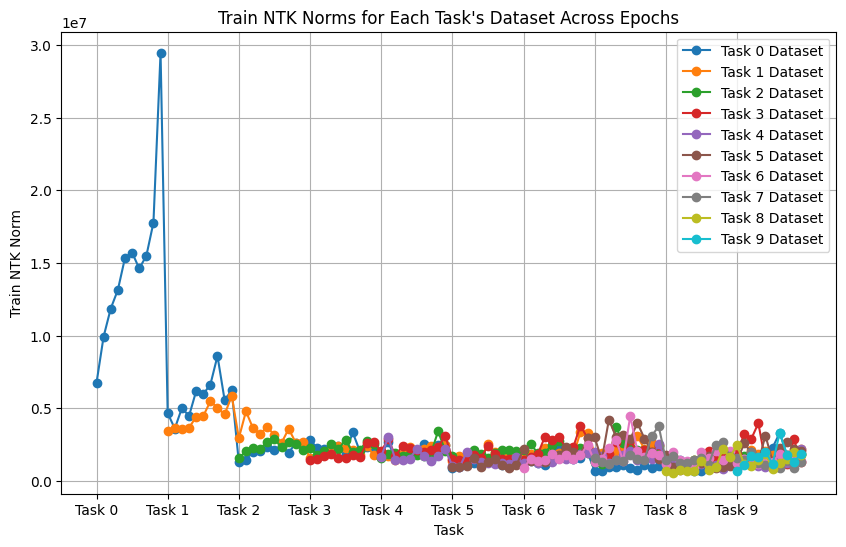

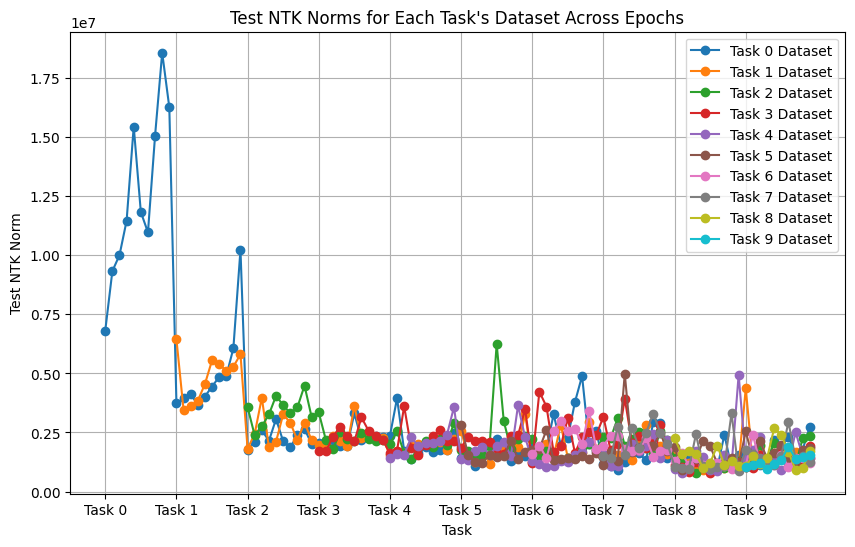

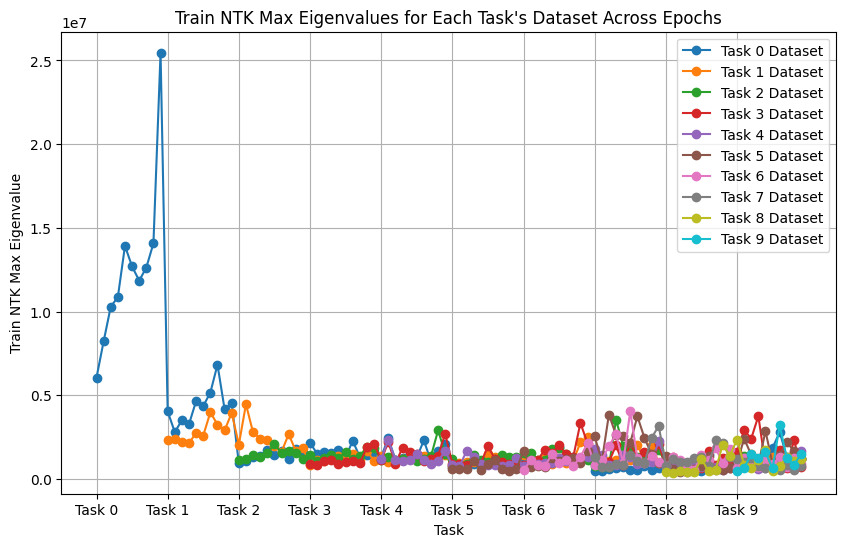

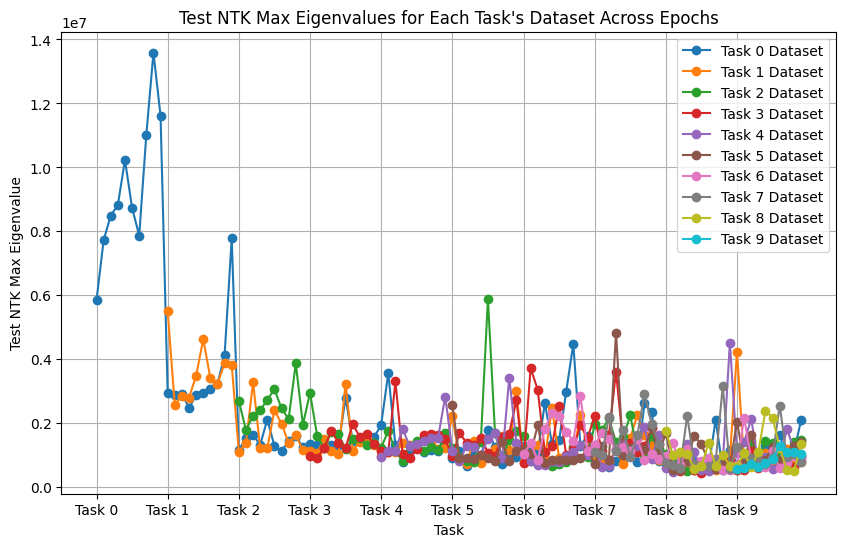

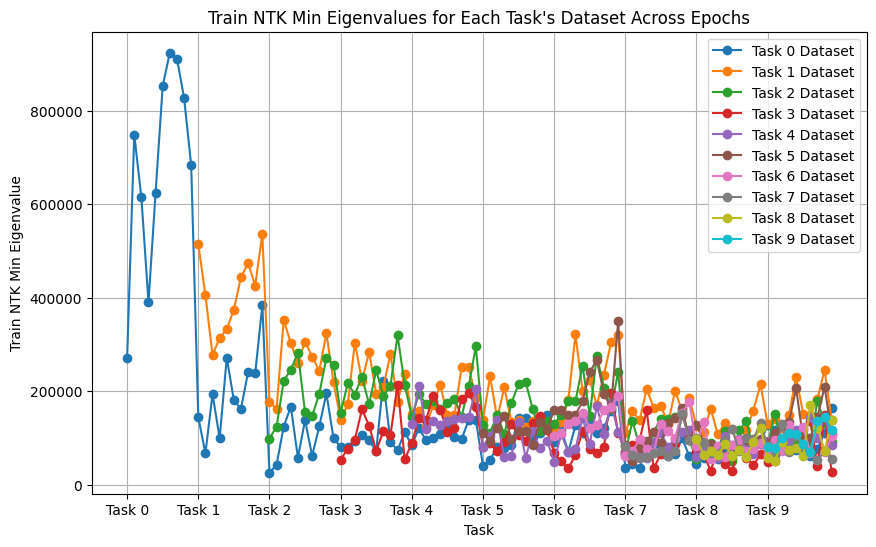

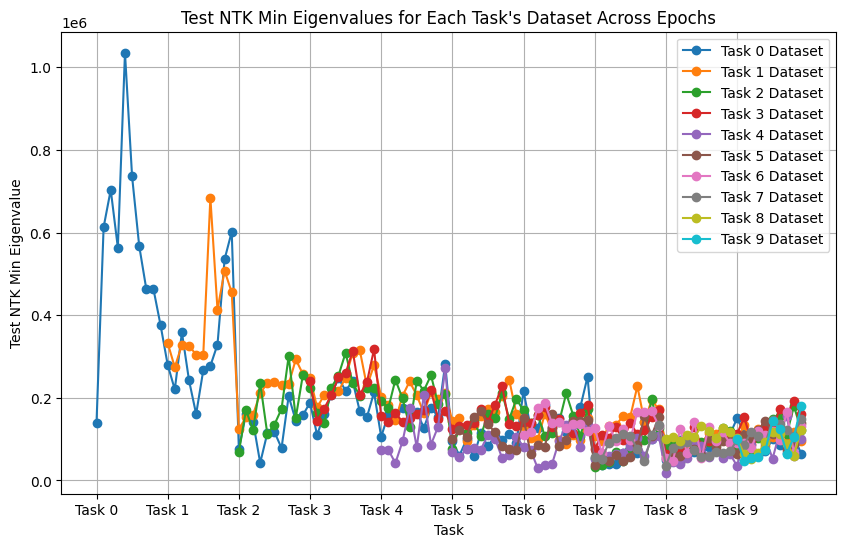

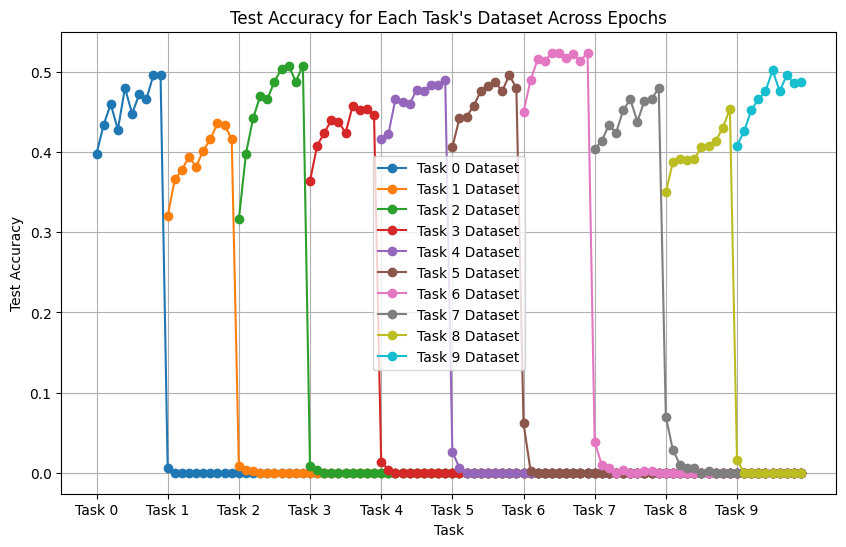


=== Task 1 ===
Epoch 1, Train Loss: 2.4664, Val Loss: 1.7914, Train Accuracy: 0.3391, Val Accuracy: 0.3760
Accuracy on Task 1 at Epoch 1: 0.3760
Epoch 2, Train Loss: 1.6640, Val Loss: 1.6189, Train Accuracy: 0.4278, Val Accuracy: 0.4300
Accuracy on Task 1 at Epoch 2: 0.4300
Epoch 3, Train Loss: 1.5644, Val Loss: 1.6178, Train Accuracy: 0.4671, Val Accuracy: 0.4320
Accuracy on Task 1 at Epoch 3: 0.4320
Epoch 4, Train Loss: 1.4488, Val Loss: 1.6780, Train Accuracy: 0.5171, Val Accuracy: 0.4580
Accuracy on Task 1 at Epoch 4: 0.4580
Epoch 5, Train Loss: 1.3705, Val Loss: 1.6678, Train Accuracy: 0.5360, Val Accuracy: 0.4360
Accuracy on Task 1 at Epoch 5: 0.4360
Epoch 6, Train Loss: 1.2939, Val Loss: 1.6175, Train Accuracy: 0.5680, Val Accuracy: 0.4600
Accuracy on Task 1 at Epoch 6: 0.4600
Epoch 7, Train Loss: 1.2297, Val Loss: 1.6126, Train Accuracy: 0.5833, Val Accuracy: 0.4780
Accuracy on Task 1 at Epoch 7: 0.4780
Epoch 8, Train Loss: 1.1567, Val Loss: 1.6693, Train Accuracy: 0.6062, Val

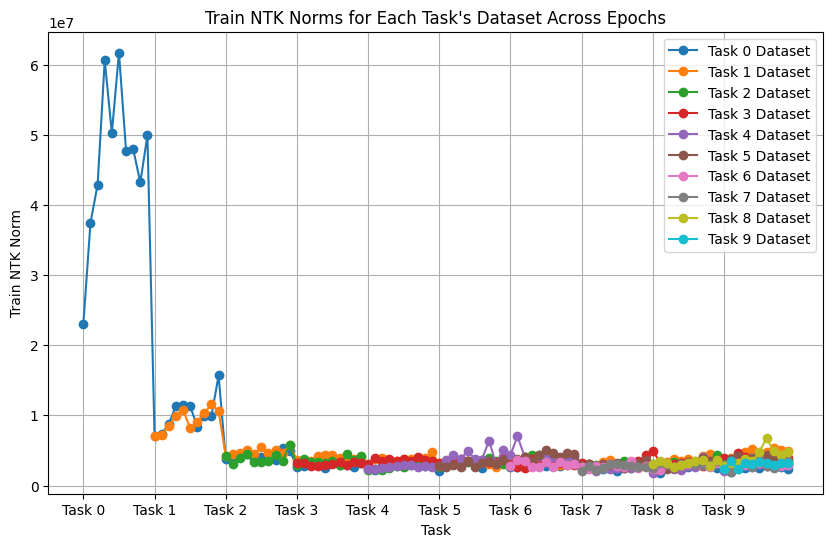

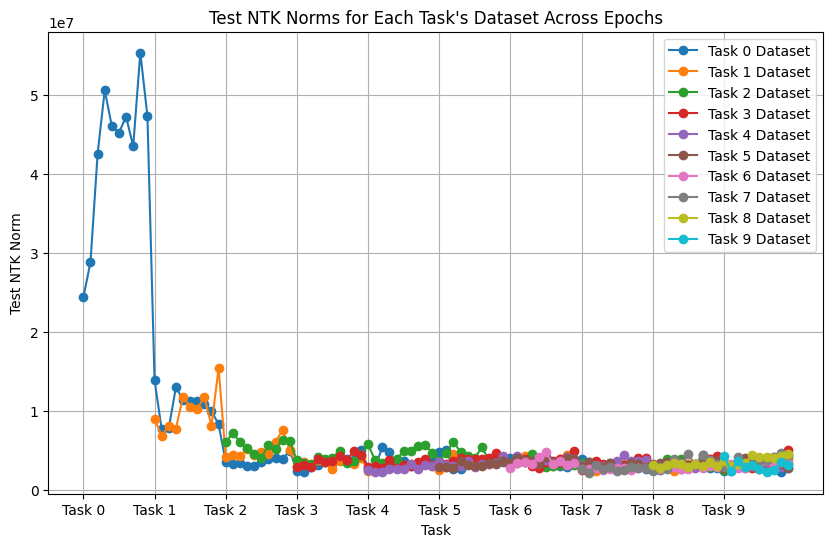

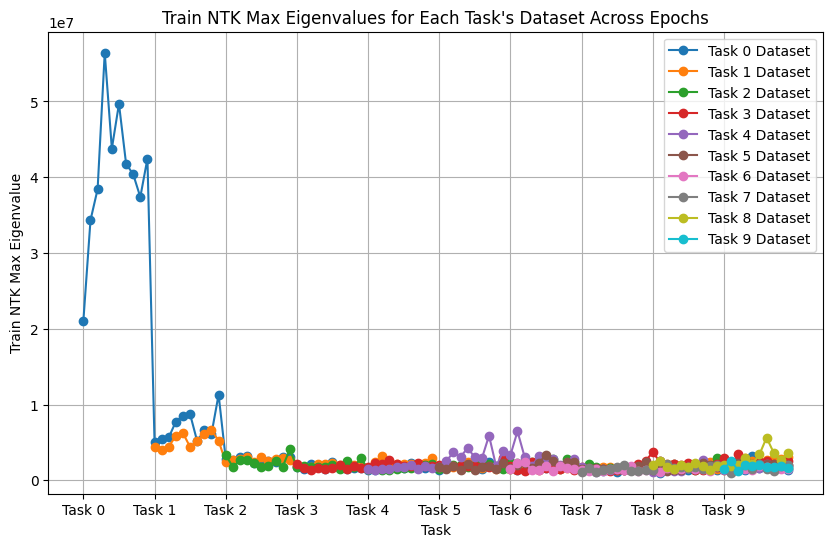

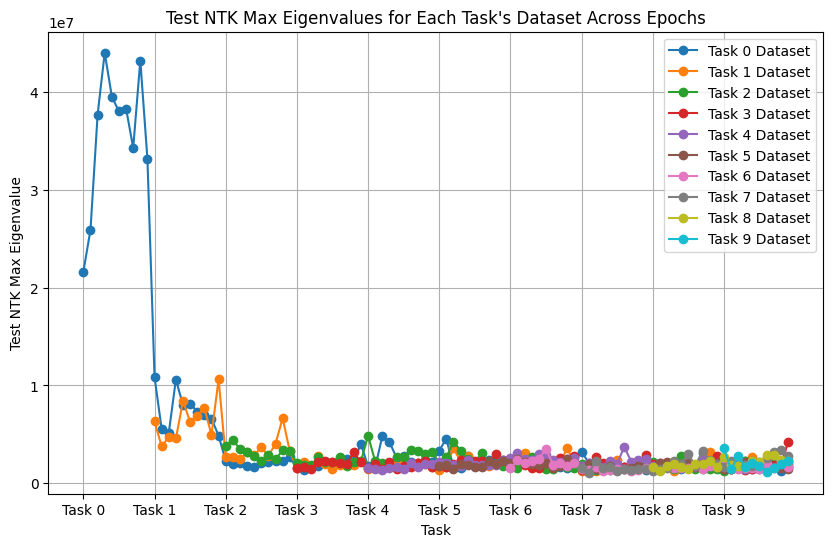

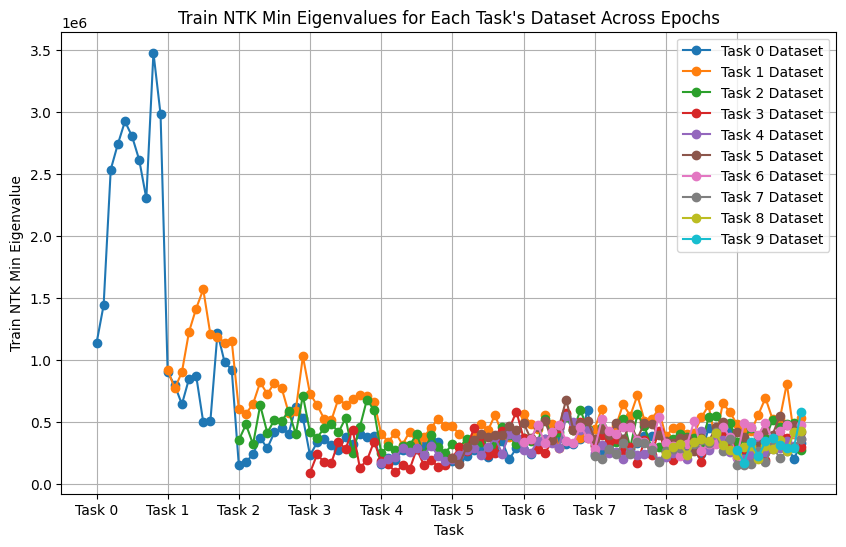

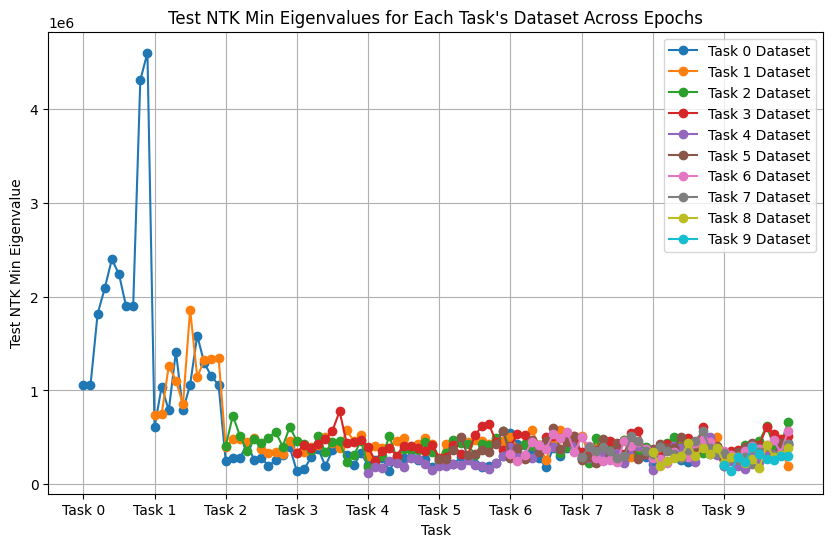

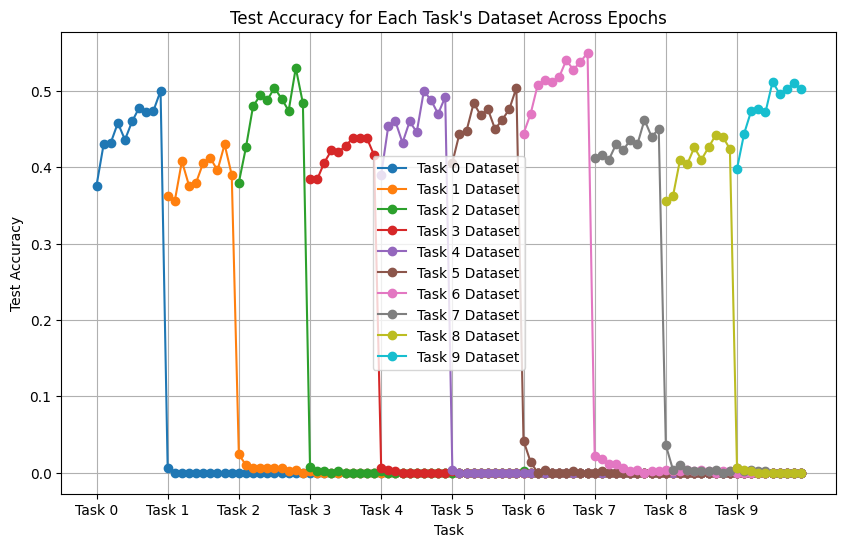


=== Task 1 ===
Epoch 1, Train Loss: 2.7895, Val Loss: 2.2918, Train Accuracy: 0.3167, Val Accuracy: 0.3660
Accuracy on Task 1 at Epoch 1: 0.3660
Epoch 2, Train Loss: 2.0299, Val Loss: 2.0618, Train Accuracy: 0.3878, Val Accuracy: 0.3880
Accuracy on Task 1 at Epoch 2: 0.3880
Epoch 3, Train Loss: 1.6486, Val Loss: 1.6774, Train Accuracy: 0.4562, Val Accuracy: 0.4240
Accuracy on Task 1 at Epoch 3: 0.4240
Epoch 4, Train Loss: 1.4843, Val Loss: 1.7127, Train Accuracy: 0.5020, Val Accuracy: 0.4240
Accuracy on Task 1 at Epoch 4: 0.4240
Epoch 5, Train Loss: 1.4114, Val Loss: 1.8146, Train Accuracy: 0.5184, Val Accuracy: 0.4520
Accuracy on Task 1 at Epoch 5: 0.4520
Epoch 6, Train Loss: 1.3463, Val Loss: 1.6930, Train Accuracy: 0.5496, Val Accuracy: 0.4700
Accuracy on Task 1 at Epoch 6: 0.4700
Epoch 7, Train Loss: 1.2980, Val Loss: 1.6860, Train Accuracy: 0.5700, Val Accuracy: 0.5060
Accuracy on Task 1 at Epoch 7: 0.5060
Epoch 8, Train Loss: 1.1821, Val Loss: 1.6357, Train Accuracy: 0.6069, Val

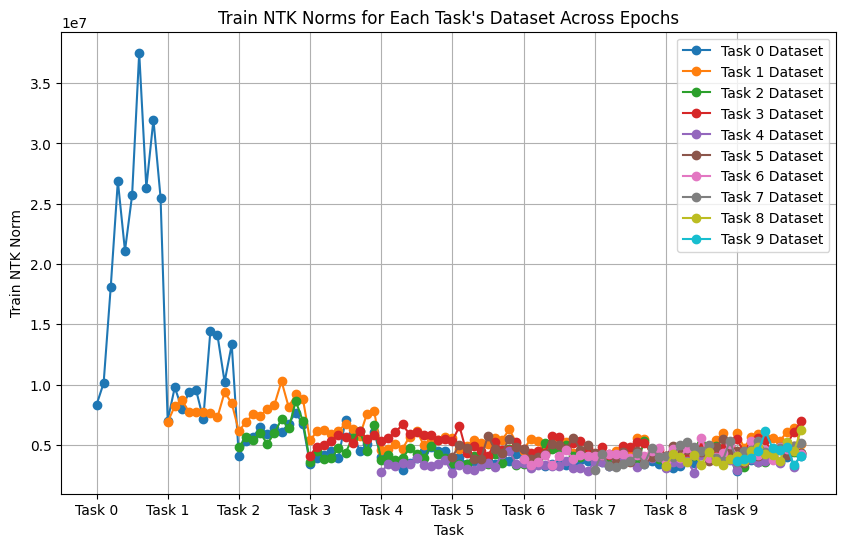

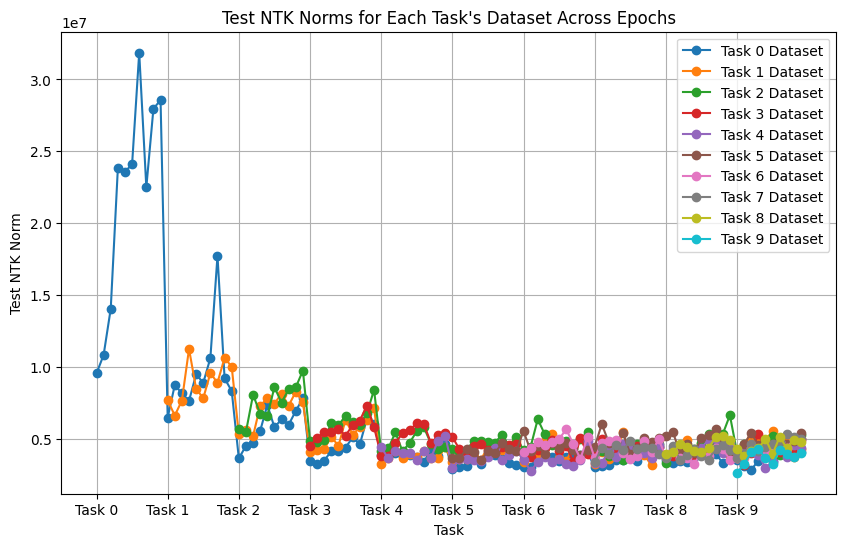

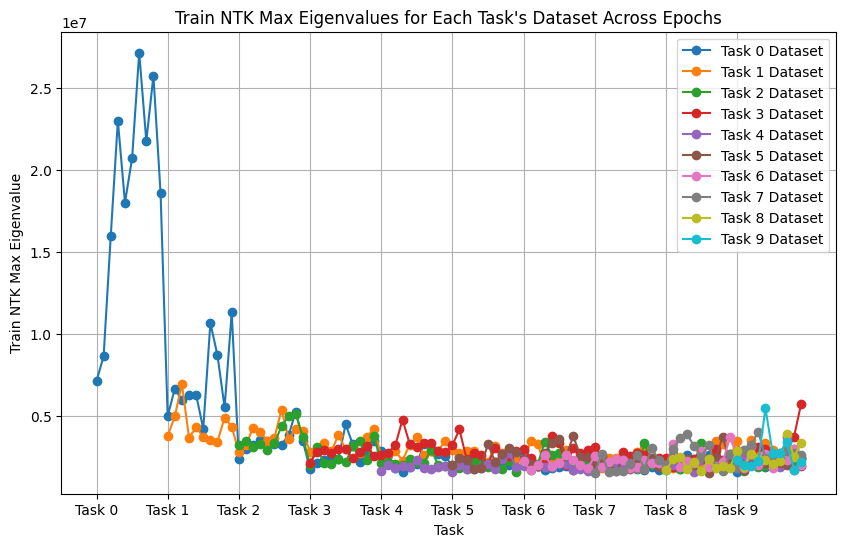

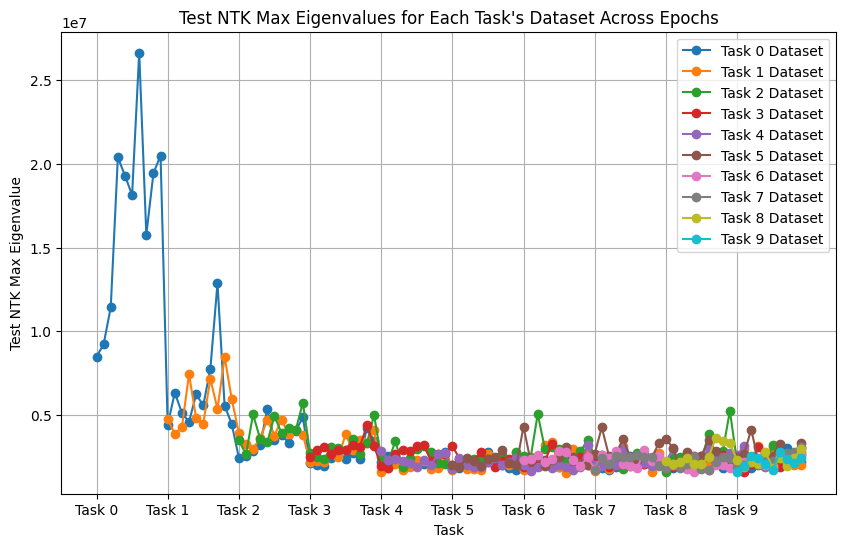

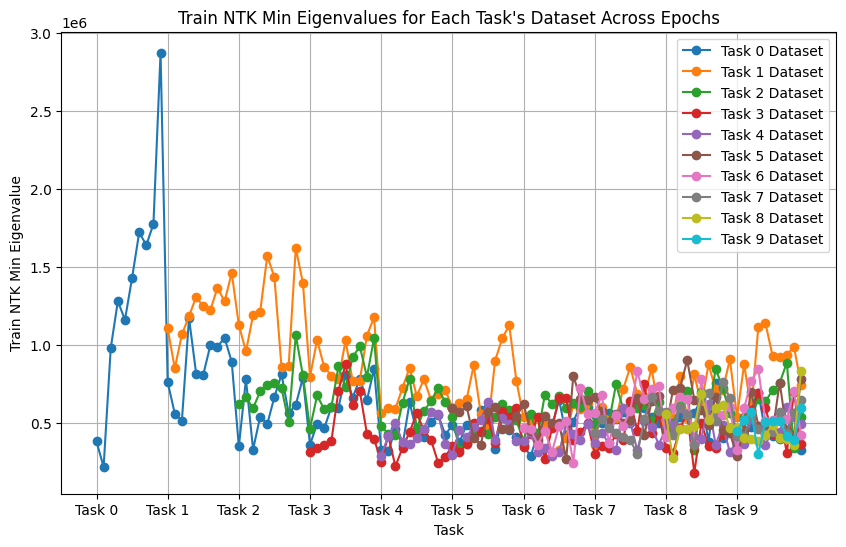

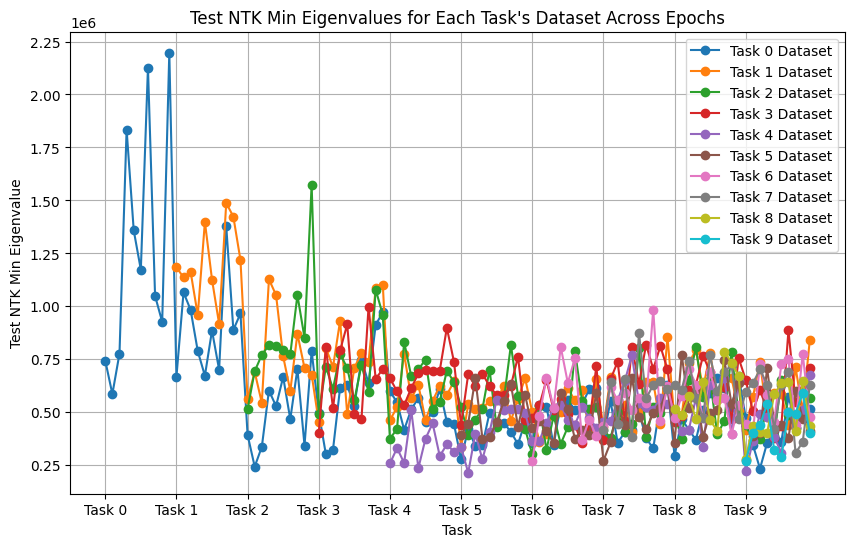

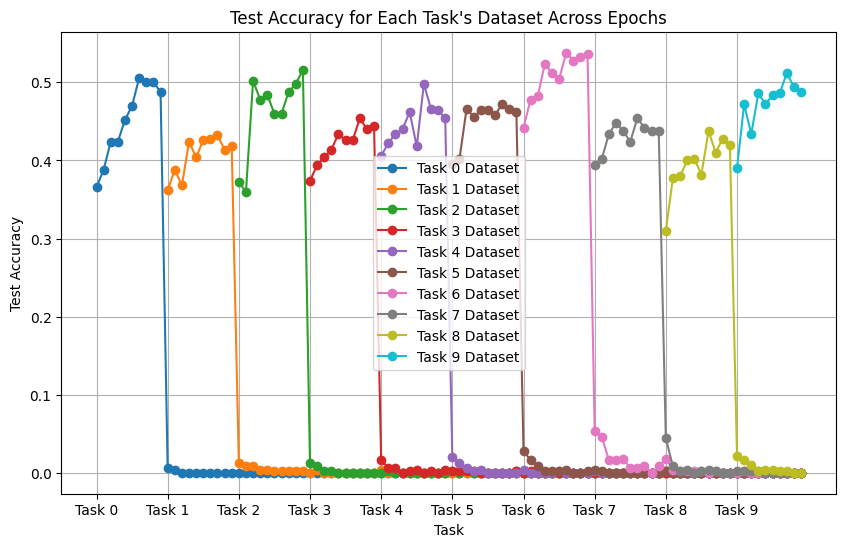


=== Task 1 ===
Epoch 1, Train Loss: 4.1985, Val Loss: 3.8396, Train Accuracy: 0.1800, Val Accuracy: 0.2280
Accuracy on Task 1 at Epoch 1: 0.2280
Epoch 2, Train Loss: 3.2880, Val Loss: 3.0075, Train Accuracy: 0.2509, Val Accuracy: 0.2820
Accuracy on Task 1 at Epoch 2: 0.2820
Epoch 3, Train Loss: 2.9696, Val Loss: 2.9657, Train Accuracy: 0.2987, Val Accuracy: 0.3200
Accuracy on Task 1 at Epoch 3: 0.3200
Epoch 4, Train Loss: 2.7750, Val Loss: 3.0681, Train Accuracy: 0.3360, Val Accuracy: 0.3200
Accuracy on Task 1 at Epoch 4: 0.3200
Epoch 5, Train Loss: 2.5808, Val Loss: 2.6311, Train Accuracy: 0.3573, Val Accuracy: 0.3580
Accuracy on Task 1 at Epoch 5: 0.3580
Epoch 6, Train Loss: 2.3779, Val Loss: 2.3921, Train Accuracy: 0.3698, Val Accuracy: 0.3660
Accuracy on Task 1 at Epoch 6: 0.3660
Epoch 7, Train Loss: 2.1940, Val Loss: 2.3890, Train Accuracy: 0.4169, Val Accuracy: 0.4120
Accuracy on Task 1 at Epoch 7: 0.4120
Epoch 8, Train Loss: 2.3039, Val Loss: 2.1280, Train Accuracy: 0.4036, Val

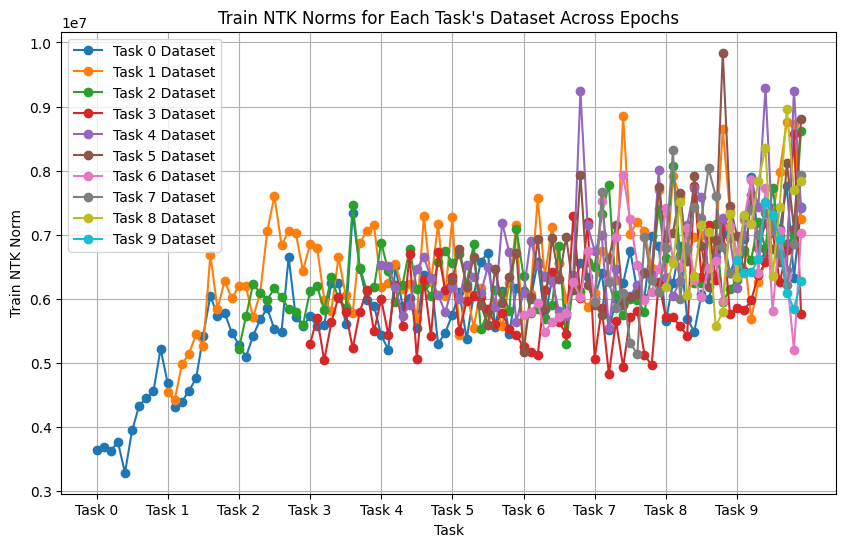

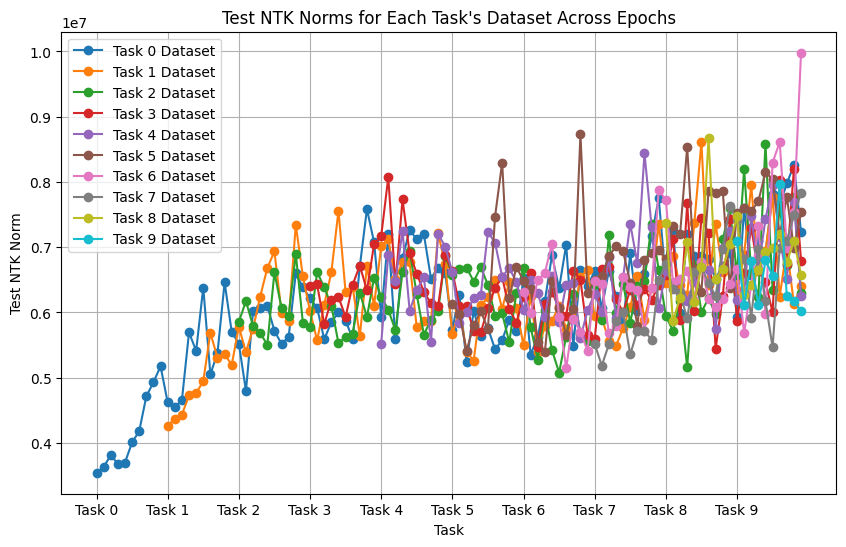

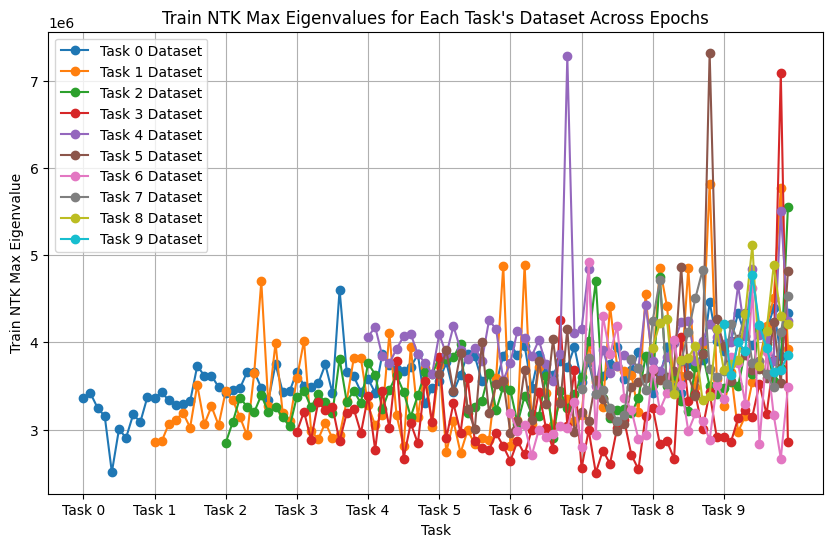

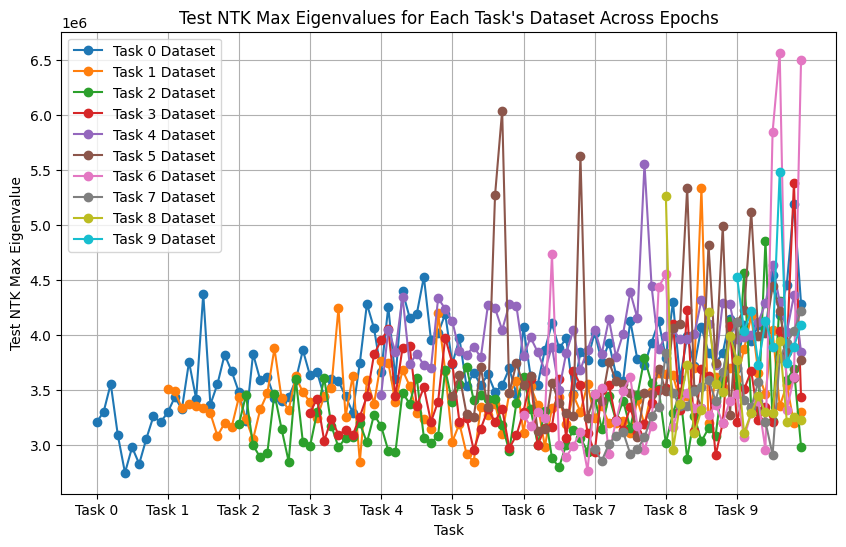

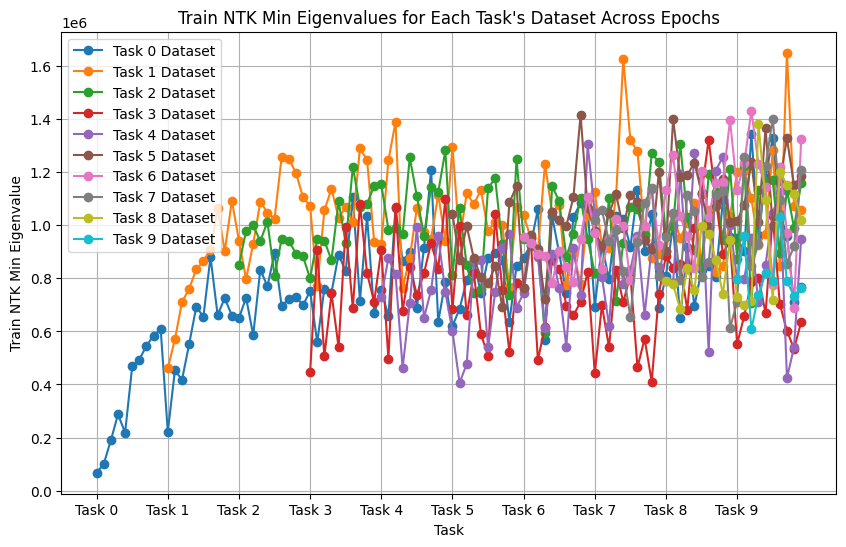

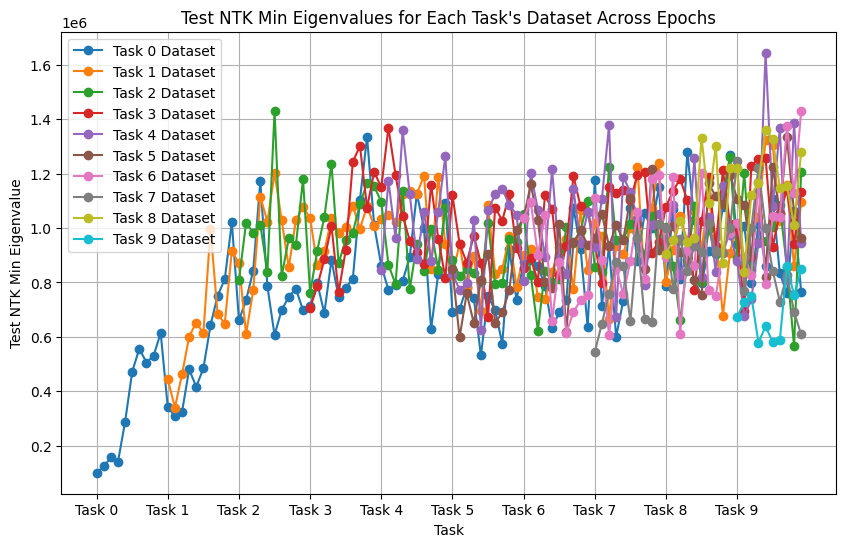

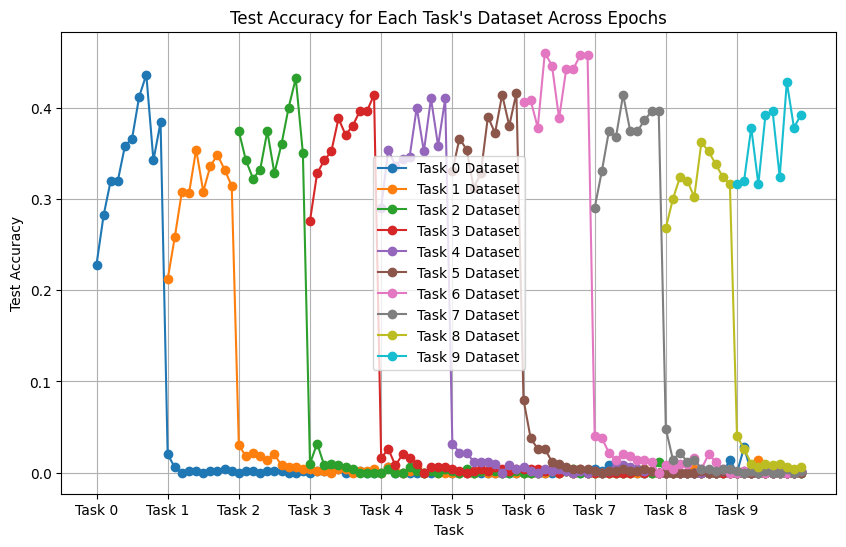

In [2]:
layer_sizes_list = [
    [32 * 32 * 3] + [100] * 3 + [100],
    [32 * 32 * 3] + [500] * 3 + [100],
    [32 * 32 * 3] + [1000] * 3 + [100],
    [32 * 32 * 3] + [5000] * 3 + [100]
    
]

metrics = {
    "MLP":{
        "CIFAR100": {
            "10-10-10": {
                "100": {"train_ntk_matrices": None, "test_ntk_matrices": None, "task_accuracies": None},
                "500": {"train_ntk_matrices": None, "test_ntk_matrices": None, "task_accuracies": None},
                "1000": {"train_ntk_matrices": None, "test_ntk_matrices": None, "task_accuracies": None},
                "5000": {"train_ntk_matrices": None, "test_ntk_matrices": None, "task_accuracies": None}

            }
        }
    }
}

for layer_sizes in layer_sizes_list:
    width = layer_sizes[1]  
    model = NN(layer_sizes).to(device) 
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    epochs_per_task = 10

    train_ntk_matrices, test_ntk_matrices, task_accuracies = train_and_evaluate(model, epochs_per_task)

    metrics["MLP"]["CIFAR100"]["10-10-10"][str(width)] = {
        "train_ntk_matrices": train_ntk_matrices,
        "test_ntk_matrices": test_ntk_matrices,
        "task_accuracies": task_accuracies
    }
    
import pickle 
with open("mlp_cifar100_10_10_10epo_cuda.pkl", "wb") as file:
    pickle.dump(metrics, file)

In [3]:
import pickle 
with open("mlp_cifar100_10_10_10epo_cuda.pkl", "wb") as file:
    pickle.dump(metrics, file)


=== Task 1 ===
Epoch 1, Train Loss: 3.9485, Val Loss: 3.3848, Train Accuracy: 0.1867, Val Accuracy: 0.2900
Accuracy on Task 1 at Epoch 1: 0.2900
Epoch 2, Train Loss: 3.0498, Val Loss: 2.7921, Train Accuracy: 0.3402, Val Accuracy: 0.3940
Accuracy on Task 1 at Epoch 2: 0.3940
Epoch 3, Train Loss: 2.5692, Val Loss: 2.3962, Train Accuracy: 0.3936, Val Accuracy: 0.4240
Accuracy on Task 1 at Epoch 3: 0.4240
Epoch 4, Train Loss: 2.2200, Val Loss: 2.1137, Train Accuracy: 0.4253, Val Accuracy: 0.4300
Accuracy on Task 1 at Epoch 4: 0.4300
Epoch 5, Train Loss: 1.9667, Val Loss: 1.9079, Train Accuracy: 0.4467, Val Accuracy: 0.4640
Accuracy on Task 1 at Epoch 5: 0.4640
Epoch 6, Train Loss: 1.7943, Val Loss: 1.7888, Train Accuracy: 0.4640, Val Accuracy: 0.4700
Accuracy on Task 1 at Epoch 6: 0.4700
Epoch 7, Train Loss: 1.6863, Val Loss: 1.7155, Train Accuracy: 0.4727, Val Accuracy: 0.4720
Accuracy on Task 1 at Epoch 7: 0.4720
Epoch 8, Train Loss: 1.6149, Val Loss: 1.6709, Train Accuracy: 0.4822, Val

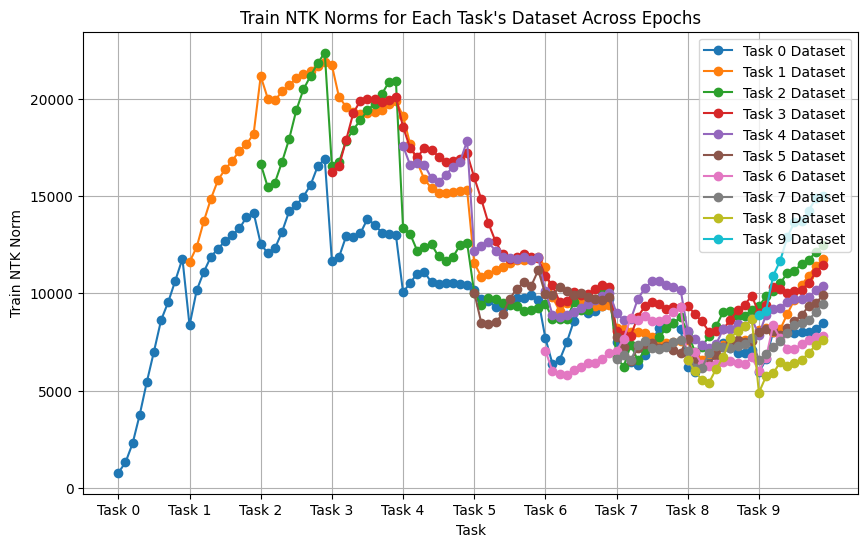

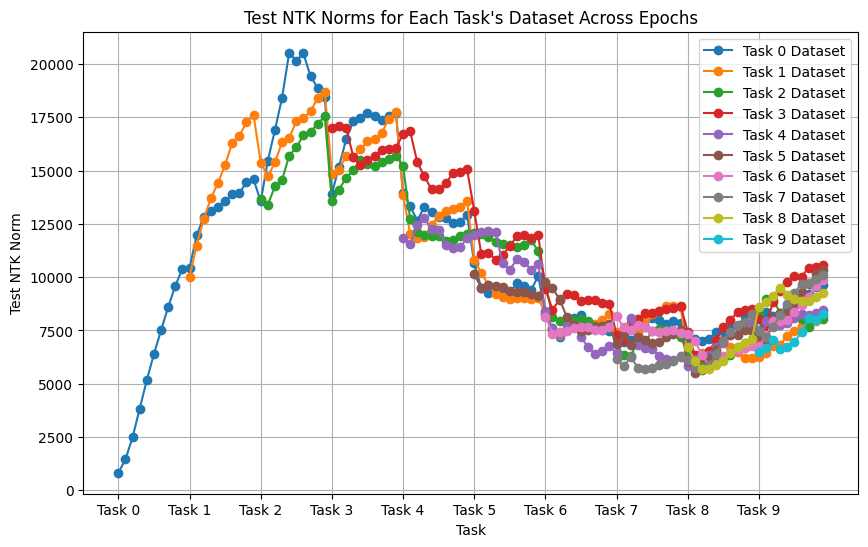

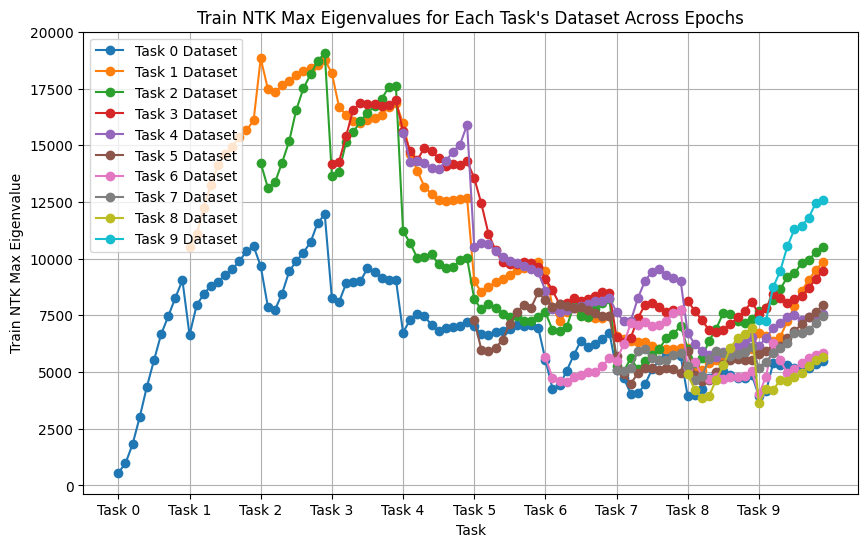

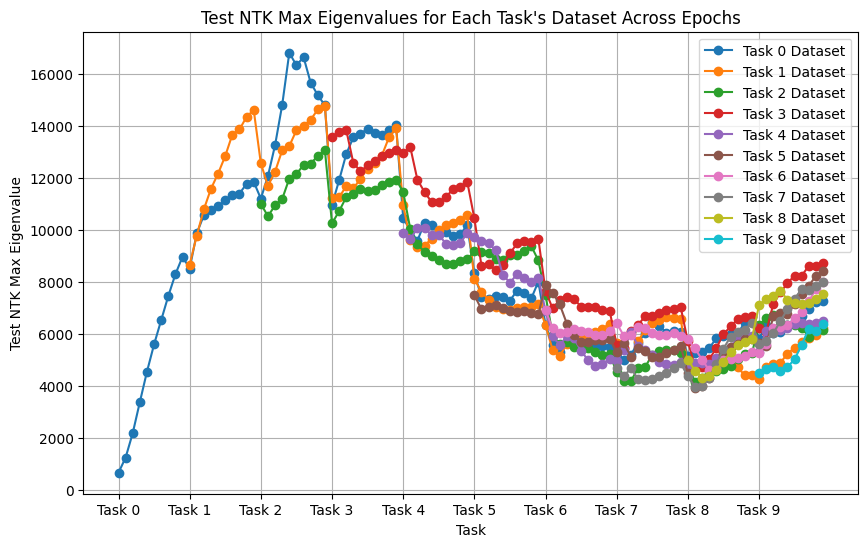

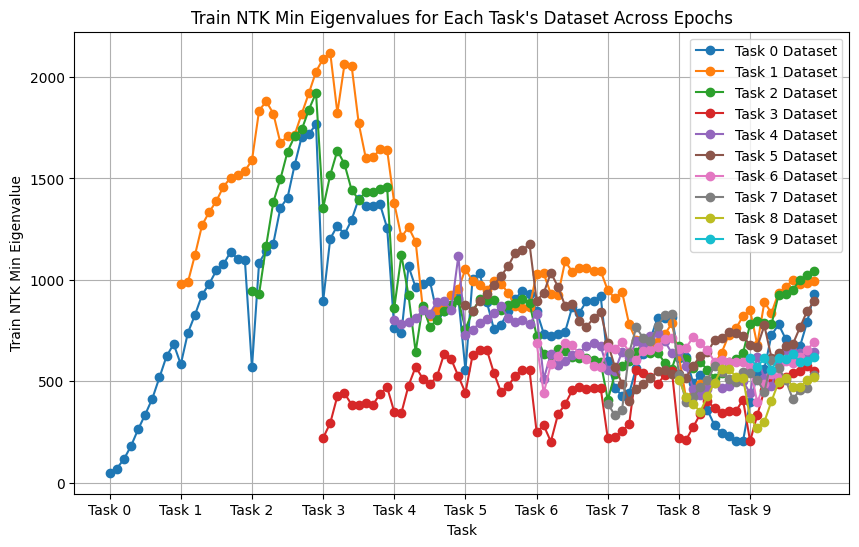

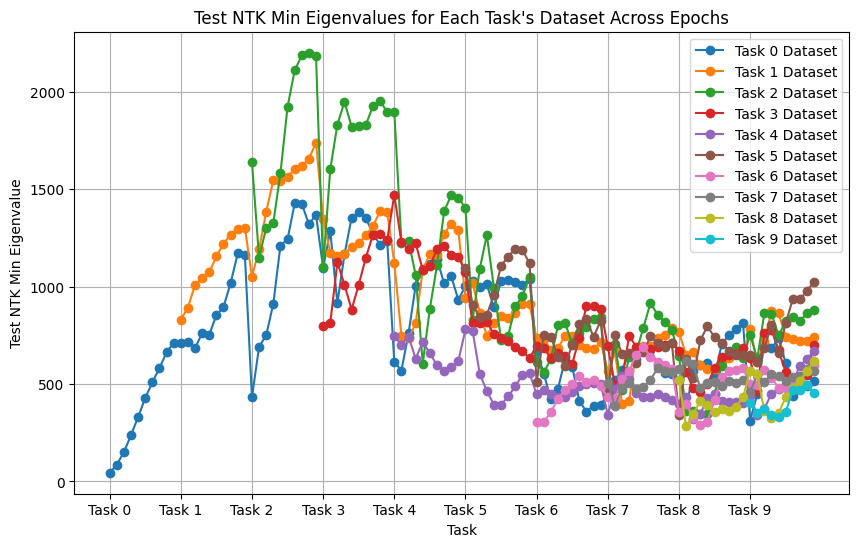

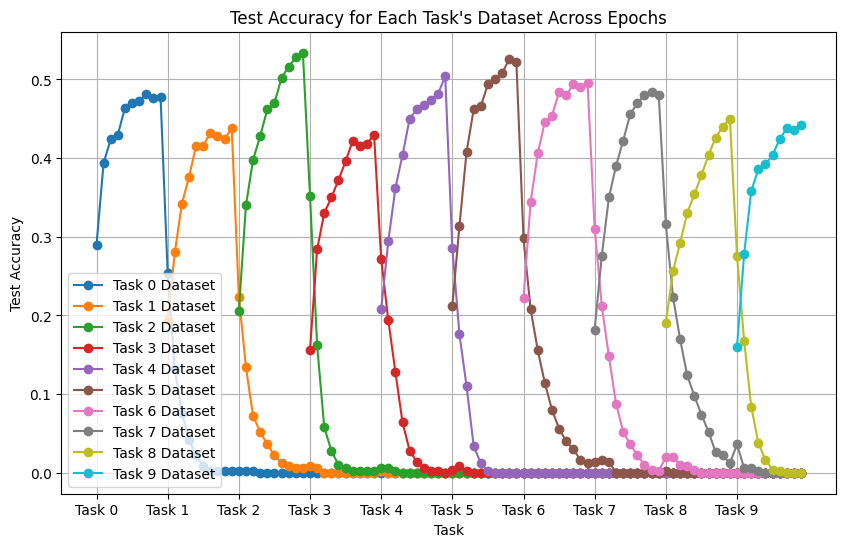


=== Task 1 ===
Epoch 1, Train Loss: 3.3842, Val Loss: 2.6962, Train Accuracy: 0.2862, Val Accuracy: 0.4160
Accuracy on Task 1 at Epoch 1: 0.4160
Epoch 2, Train Loss: 2.4220, Val Loss: 2.2105, Train Accuracy: 0.4151, Val Accuracy: 0.4480
Accuracy on Task 1 at Epoch 2: 0.4480
Epoch 3, Train Loss: 2.0299, Val Loss: 1.9298, Train Accuracy: 0.4567, Val Accuracy: 0.4760
Accuracy on Task 1 at Epoch 3: 0.4760
Epoch 4, Train Loss: 1.7668, Val Loss: 1.7653, Train Accuracy: 0.4858, Val Accuracy: 0.5000
Accuracy on Task 1 at Epoch 4: 0.5000
Epoch 5, Train Loss: 1.6038, Val Loss: 1.6628, Train Accuracy: 0.5133, Val Accuracy: 0.4940
Accuracy on Task 1 at Epoch 5: 0.4940
Epoch 6, Train Loss: 1.5001, Val Loss: 1.6126, Train Accuracy: 0.5271, Val Accuracy: 0.4940
Accuracy on Task 1 at Epoch 6: 0.4940
Epoch 7, Train Loss: 1.4283, Val Loss: 1.5579, Train Accuracy: 0.5518, Val Accuracy: 0.5080
Accuracy on Task 1 at Epoch 7: 0.5080
Epoch 8, Train Loss: 1.3753, Val Loss: 1.5278, Train Accuracy: 0.5647, Val

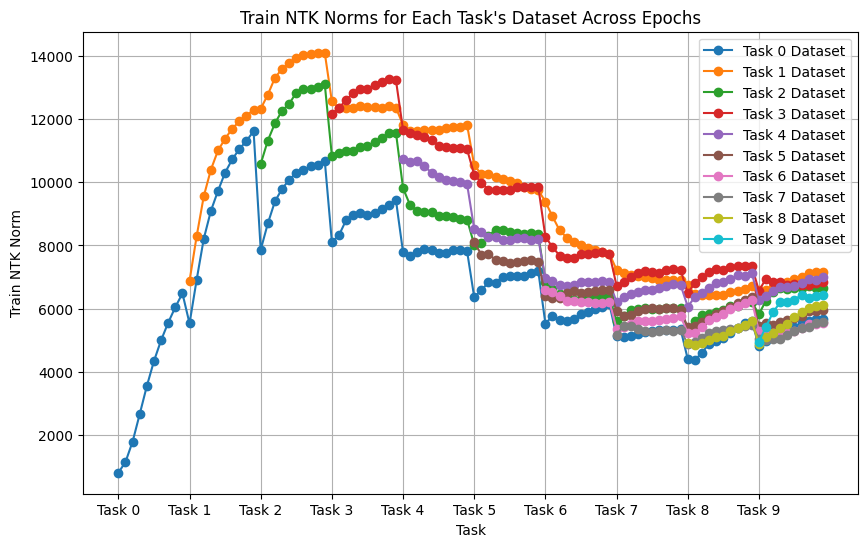

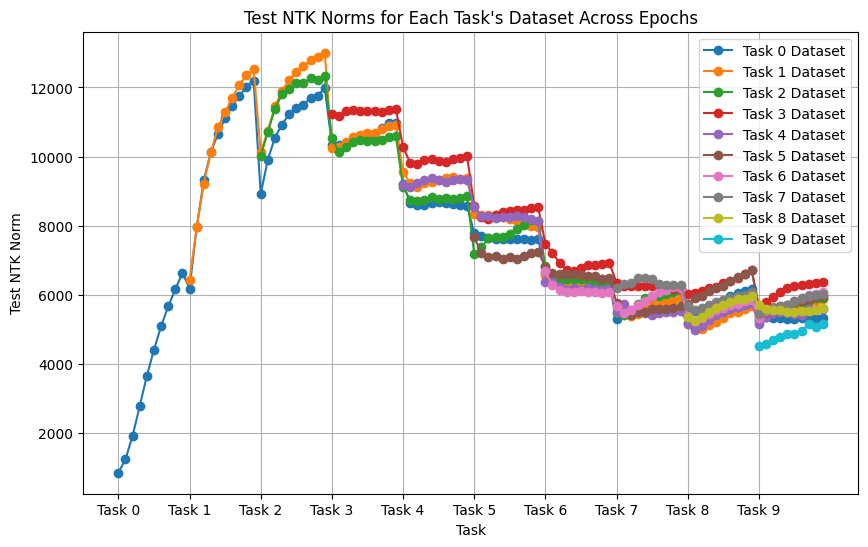

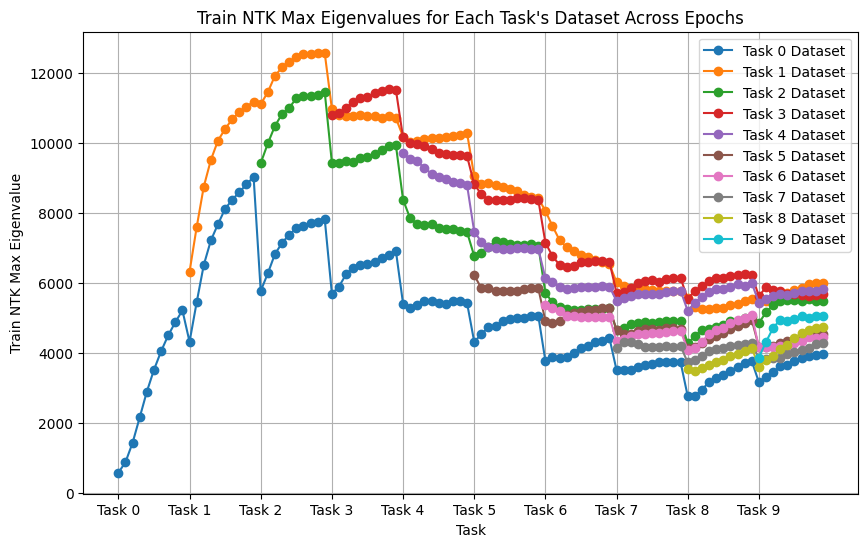

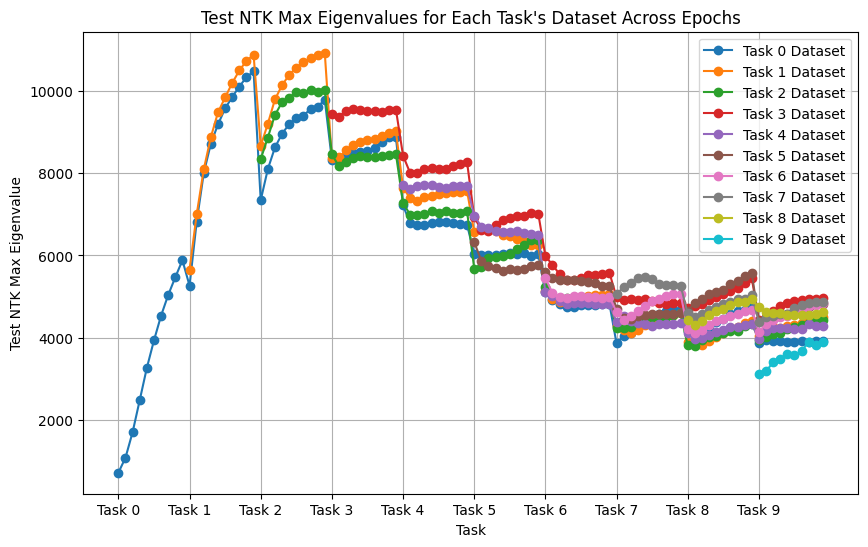

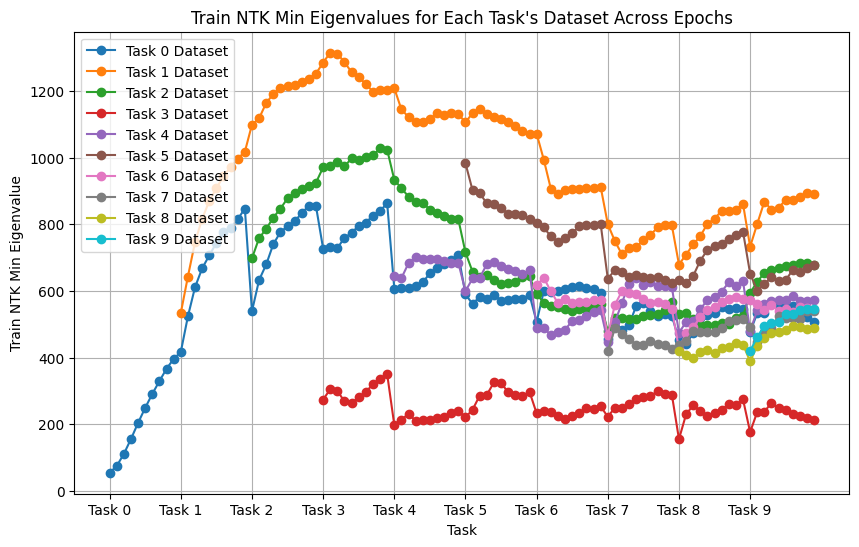

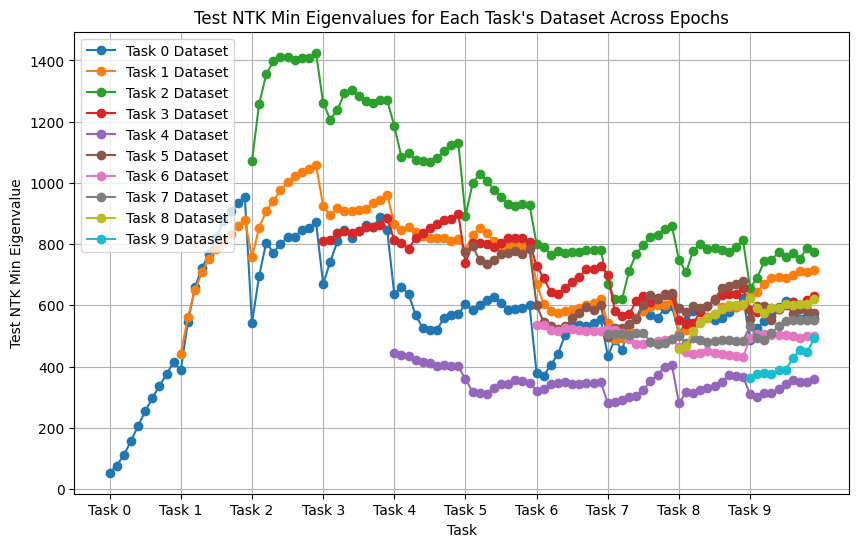

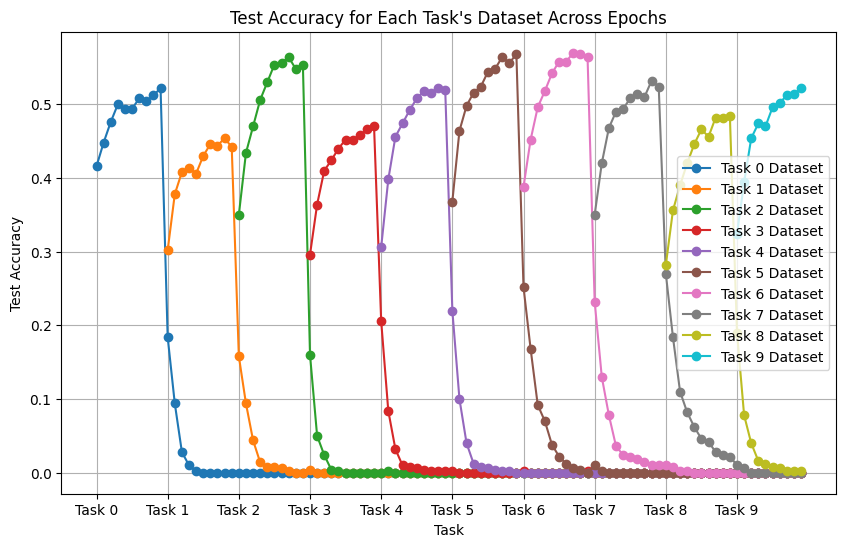


=== Task 1 ===
Epoch 1, Train Loss: 3.1972, Val Loss: 2.4565, Train Accuracy: 0.3098, Val Accuracy: 0.4420
Accuracy on Task 1 at Epoch 1: 0.4420
Epoch 2, Train Loss: 2.2659, Val Loss: 2.0556, Train Accuracy: 0.4291, Val Accuracy: 0.4620
Accuracy on Task 1 at Epoch 2: 0.4620
Epoch 3, Train Loss: 1.8860, Val Loss: 1.8102, Train Accuracy: 0.4769, Val Accuracy: 0.4880
Accuracy on Task 1 at Epoch 3: 0.4880
Epoch 4, Train Loss: 1.6439, Val Loss: 1.6702, Train Accuracy: 0.5171, Val Accuracy: 0.4940
Accuracy on Task 1 at Epoch 4: 0.4940
Epoch 5, Train Loss: 1.4934, Val Loss: 1.5945, Train Accuracy: 0.5400, Val Accuracy: 0.4960
Accuracy on Task 1 at Epoch 5: 0.4960
Epoch 6, Train Loss: 1.3937, Val Loss: 1.5525, Train Accuracy: 0.5629, Val Accuracy: 0.5040
Accuracy on Task 1 at Epoch 6: 0.5040
Epoch 7, Train Loss: 1.3179, Val Loss: 1.5222, Train Accuracy: 0.5904, Val Accuracy: 0.5120
Accuracy on Task 1 at Epoch 7: 0.5120
Epoch 8, Train Loss: 1.2620, Val Loss: 1.4886, Train Accuracy: 0.6104, Val

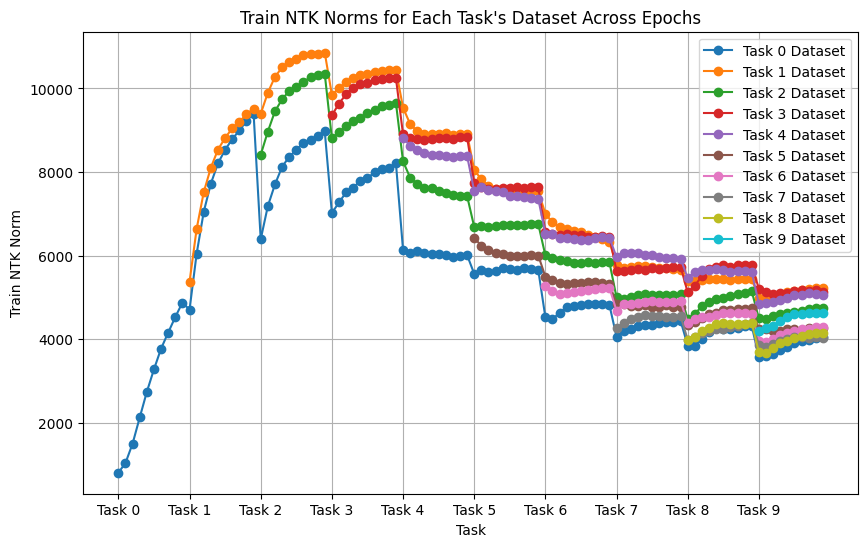

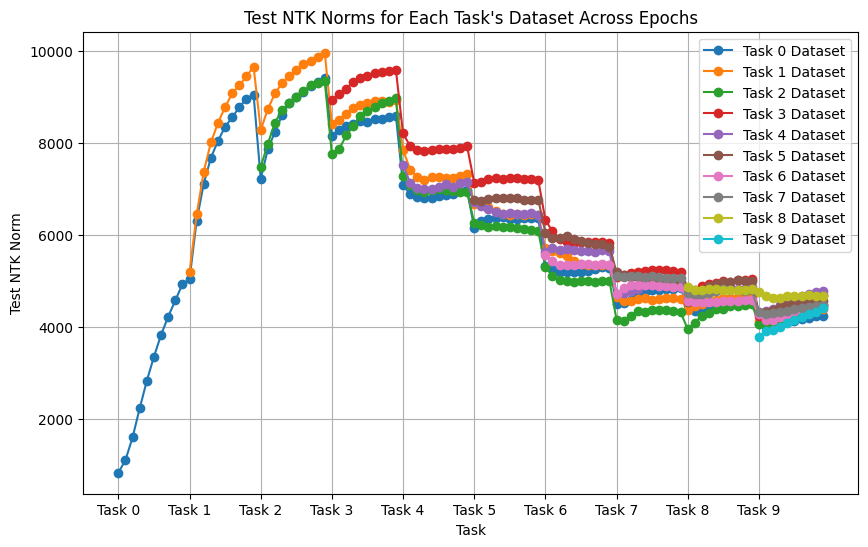

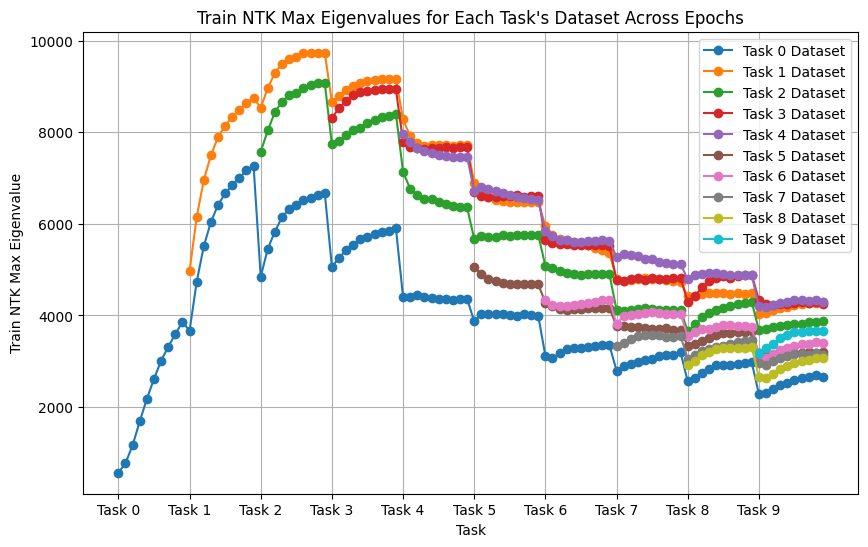

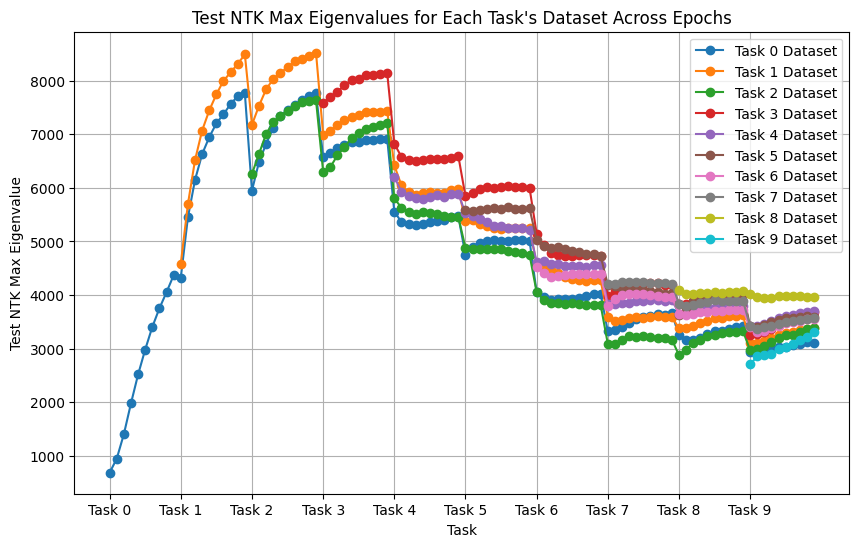

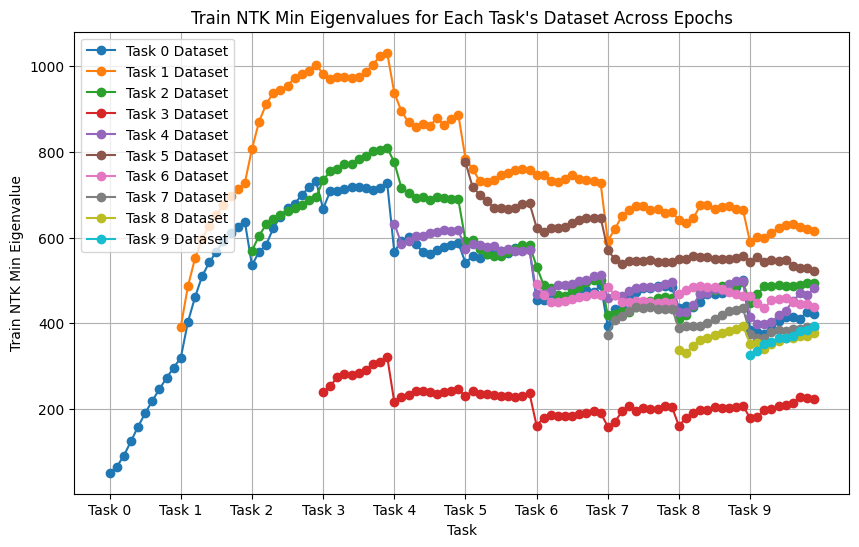

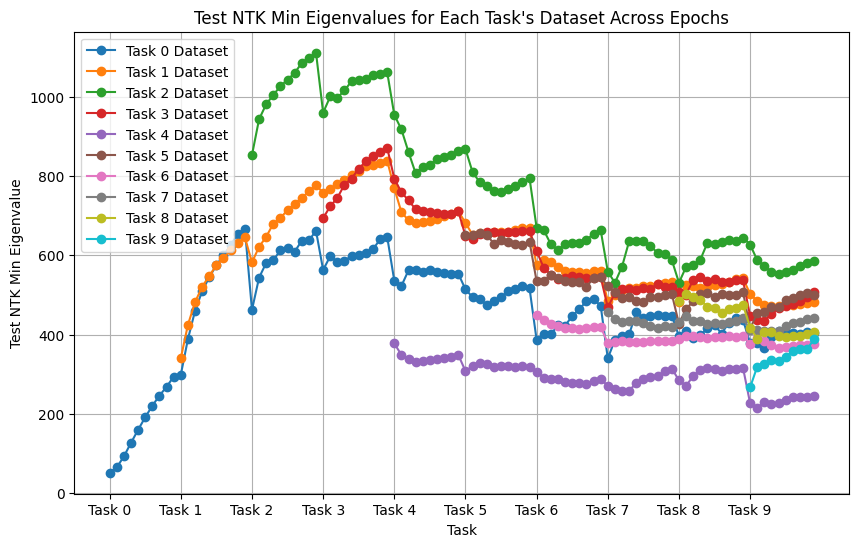

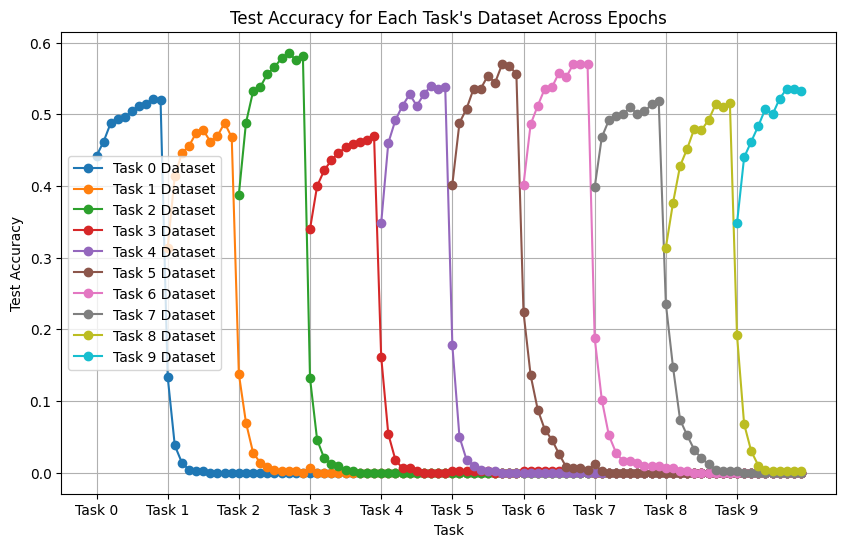


=== Task 1 ===
Epoch 1, Train Loss: 2.7586, Val Loss: 2.1457, Train Accuracy: 0.3638, Val Accuracy: 0.4680
Accuracy on Task 1 at Epoch 1: 0.4680
Epoch 2, Train Loss: 1.8716, Val Loss: 1.8225, Train Accuracy: 0.4844, Val Accuracy: 0.4900
Accuracy on Task 1 at Epoch 2: 0.4900
Epoch 3, Train Loss: 1.5478, Val Loss: 1.6749, Train Accuracy: 0.5369, Val Accuracy: 0.4860
Accuracy on Task 1 at Epoch 3: 0.4860
Epoch 4, Train Loss: 1.3460, Val Loss: 1.6290, Train Accuracy: 0.5867, Val Accuracy: 0.4860
Accuracy on Task 1 at Epoch 4: 0.4860
Epoch 5, Train Loss: 1.2186, Val Loss: 1.6014, Train Accuracy: 0.6291, Val Accuracy: 0.4960
Accuracy on Task 1 at Epoch 5: 0.4960
Epoch 6, Train Loss: 1.1167, Val Loss: 1.5739, Train Accuracy: 0.6600, Val Accuracy: 0.5120
Accuracy on Task 1 at Epoch 6: 0.5120
Epoch 7, Train Loss: 1.0363, Val Loss: 1.5107, Train Accuracy: 0.7000, Val Accuracy: 0.5160
Accuracy on Task 1 at Epoch 7: 0.5160
Epoch 8, Train Loss: 0.9660, Val Loss: 1.5203, Train Accuracy: 0.7244, Val

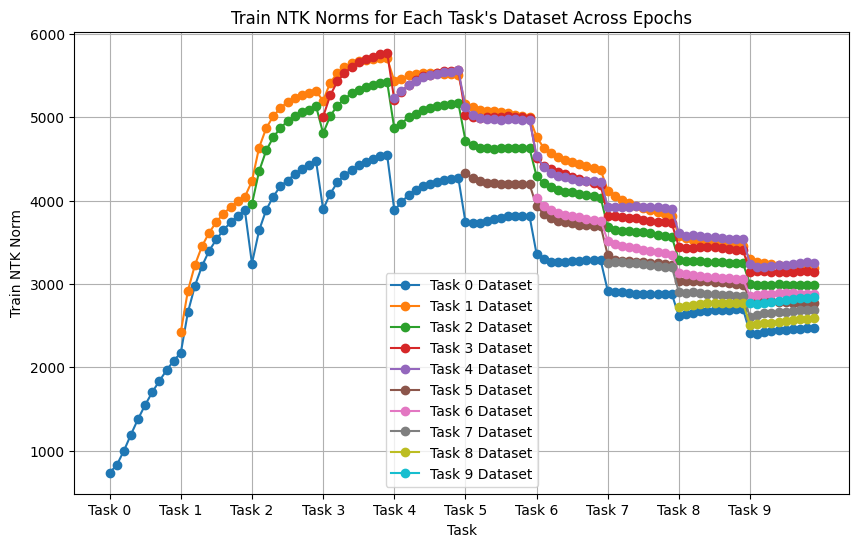

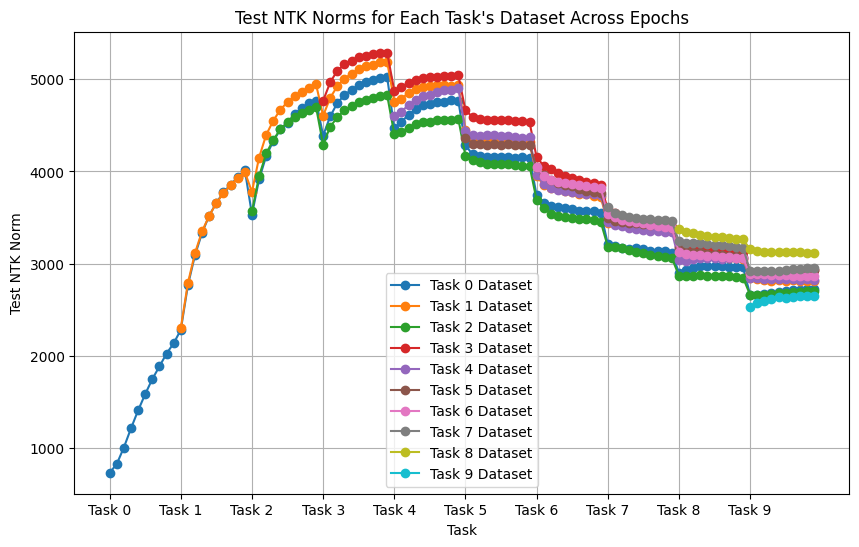

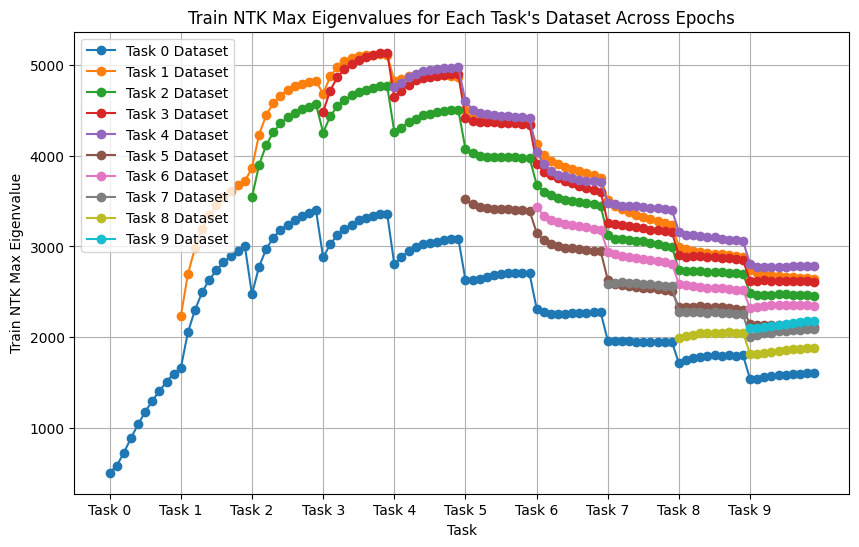

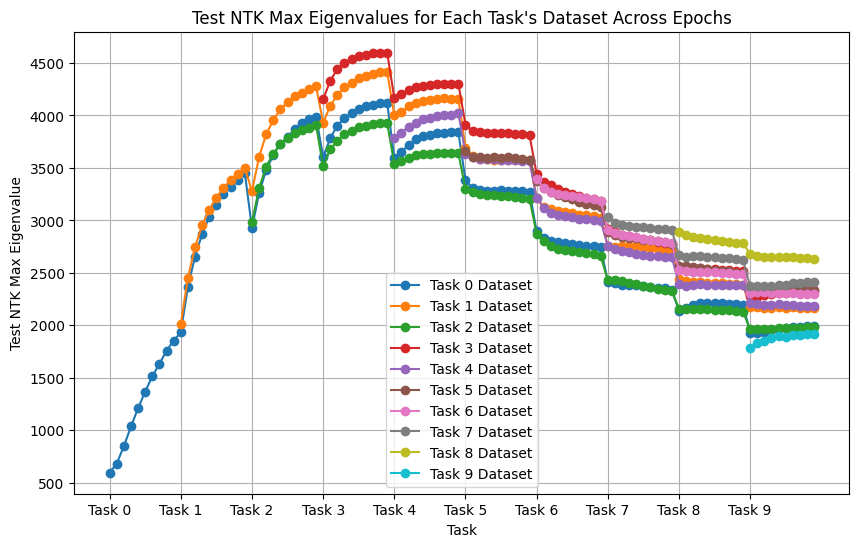

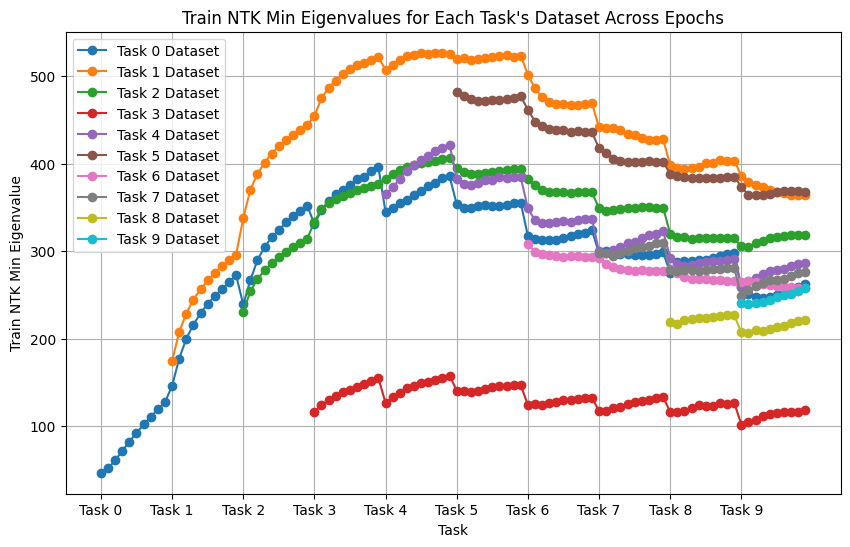

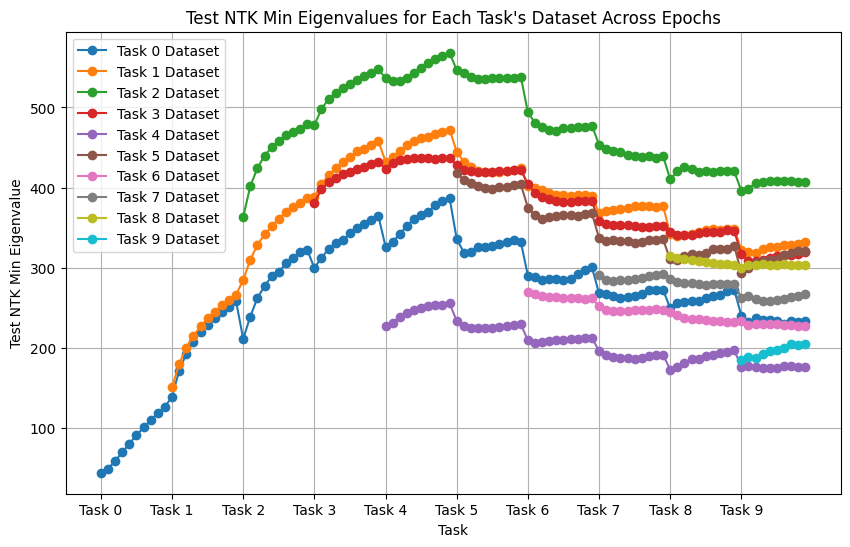

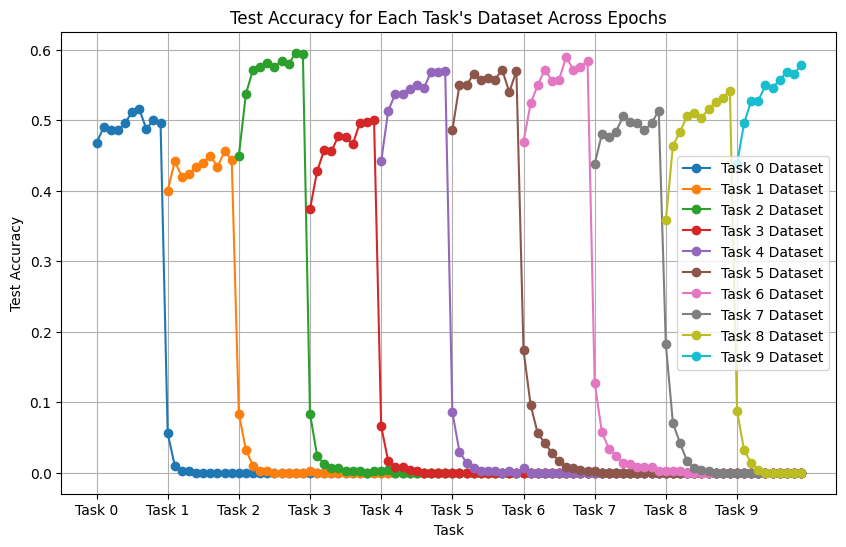

In [4]:
class SimpleRNNClassifier(nn.Module):
    def __init__(self, indim, statedim, outdim=1, nonlin=torch.erf, varw=1, varu=1, varb=0, varv=1,
                 avgpool=False, debug=False):
        super().__init__()
        self.varu = varu
        self.varw = varw
        self.varb = varb
        self.varv = varv
        self.nonlin = nonlin
        self.avgpool = avgpool
        self.debug = debug
        self.W = nn.Parameter(torch.randn(statedim, statedim))
        self.U = nn.Parameter(torch.randn(indim, statedim))
        self.b = nn.Parameter(torch.randn(statedim))
        self.v = nn.Parameter(torch.randn(statedim, outdim))
        self.randomize()

    def forward(self, inp, initstate=0):
        # Flatten the input to [batch_size, features]
        inp = inp.view(inp.size(0), -1)  # Flatten to [batch_size, indim]
        indim = self.U.shape[0]
        statedim = self.U.shape[1]
        embed = torch.einsum('bi,ij->bj', inp, self.U) / np.sqrt(indim) + self.b
        seqlen = 1  # Since we flattened the input, seqlen is 1
        state = initstate
        self._states = []
        self.hs = []
        for i in range(seqlen):
            h = embed + state  # embed is [batch_size, statedim], state is [batch_size, statedim]
            state = self.nonlin(h)
            self._states.append(state)
            if self.debug:
                state.retain_grad()
                self.hs.append(h)
            if i < seqlen - 1:
                state = state @ self.W / np.sqrt(statedim)
            else:
                if self.avgpool:
                    meanstate = sum(self._states) / len(self._states)
                    return meanstate @ self.v / np.sqrt(statedim)
                else:
                    return state @ self.v / np.sqrt(statedim)

    def randomize(self, varu=None, varw=None, varb=None, varv=None):
        varu = varu or self.varu
        varw = varw or self.varw
        varb = varb or self.varb
        varv = varv or self.varv
        with torch.no_grad():
            self.W.normal_(std=np.sqrt(varw))
            self.U.normal_(std=np.sqrt(varu))
            self.v.normal_(std=np.sqrt(varv))
            if varb > 0:
                self.b.normal_(std=np.sqrt(varb))
            else:
                self.b.zero_()

                

metrics = {
    "RNN":{
        "CIFAR100": {
            "10-10-10": {
                "100": {"train_ntk_matrices": None, "test_ntk_matrices": None, "task_accuracies": None},
                "500": {"train_ntk_matrices": None, "test_ntk_matrices": None, "task_accuracies": None},
                "1000": {"train_ntk_matrices": None, "test_ntk_matrices": None, "task_accuracies": None},
                "5000": {"train_ntk_matrices": None, "test_ntk_matrices": None, "task_accuracies": None}

            }
        }
    }
}

indim = 3 * 32 * 32  # CIFAR-10 image size (3 channels, 32x32 pixels)
statedim_list = [100,500,1000,5000]
outdim = 100

for statedim in statedim_list:
    width = statedim 
    model = SimpleRNNClassifier(indim, statedim, outdim).to(device) 
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    epochs_per_task = 10

    train_ntk_matrices, test_ntk_matrices, task_accuracies = train_and_evaluate(model, epochs_per_task)

    metrics["RNN"]["CIFAR100"]["10-10-10"][str(width)] = {
        "train_ntk_matrices": train_ntk_matrices,
        "test_ntk_matrices": test_ntk_matrices,
        "task_accuracies": task_accuracies
    }
import pickle 
with open("rnn_cifar100_10_10_10epo_cuda.pkl", "wb") as file:
    pickle.dump(metrics, file)

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import numpy as np
from tqdm import tqdm
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from continuum import ClassIncremental
from continuum.datasets import CIFAR100, CIFAR10
from continuum.tasks import split_train_val

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Load CIFAR-10 dataset
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

dataset = CIFAR100("my/data/path", download=True, train=True)

# Define the class-incremental scenario
scenario = ClassIncremental(
    dataset,
    increment=10,  # Add 2 new classes per task
    initial_increment=10  # Start with 2 classes
)

print(f"Number of classes: {scenario.nb_classes}.")
print(f"Number of tasks: {scenario.nb_tasks}.")

# Define the NN model
class CNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, num_channel):
        super(CNN, self).__init__()
        self.conv_layer1 = torch.nn.Sequential(
            torch.nn.Conv2d(input_dim, num_channel, kernel_size=5),
            torch.nn.BatchNorm2d(num_channel),
            torch.nn.ReLU(),
        )
        self.conv_layer2 = torch.nn.Sequential(
            torch.nn.Conv2d(num_channel, num_channel, kernel_size=3),
            torch.nn.BatchNorm2d(num_channel),
            torch.nn.ReLU(),
        )
        self.pool1 = torch.nn.MaxPool2d((2, 2), stride=(2, 2))
        self.conv_layer3 = torch.nn.Sequential(
            torch.nn.Conv2d(num_channel, num_channel, kernel_size=3),
            torch.nn.BatchNorm2d(num_channel),
            torch.nn.ReLU(),
        )
        self.conv_layer4 = torch.nn.Sequential(
            torch.nn.Conv2d(num_channel, num_channel, kernel_size=3),
            torch.nn.BatchNorm2d(num_channel),
            torch.nn.ReLU(),
        )
        self.backbone = nn.Sequential(
            self.conv_layer1,
            self.conv_layer2,
            self.pool1,
            self.conv_layer3,
            self.conv_layer4,
            nn.Flatten(start_dim=1)
        )
        self.fc = nn.Sequential(
            nn.Linear(num_channel*9*9, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, output_dim)
        )

    def forward(self, x):
        x = self.backbone(x)
        x = self.fc(x)
        return x

# Function to calculate accuracy
def calculate_accuracy(outputs, labels):
    preds = torch.argmax(outputs, dim=1)  # Get the predicted class
    correct = (preds == labels).float().sum()
    accuracy = correct / len(labels)
    return accuracy.item()

# Function to calculate NTK (based on simrnn_ntk)
def simrnn_ntk(inputseqs, model):
    grads = []
    for seq in inputseqs:
        model.zero_grad()  # Clear previous gradients
        out = model(seq.unsqueeze(0).to(device))  # Add batch dimension and move to GPU
        # Ensure output is a scalar for backward()
        if out.dim() > 0:
            out = out.sum()
        out.backward()  # Compute gradients
        # Collect gradients for all parameters
        grad = torch.cat([p.grad.flatten() if p.grad is not None else torch.zeros_like(p).flatten()
                          for p in model.parameters()])
        grads.append(grad)
    
    batchsize = len(inputseqs)
    ntk = torch.zeros(batchsize, batchsize, device=device)
    for i in range(batchsize):
        for j in range(0, i+1):
            ntk[i, j] = ntk[j, i] = torch.dot(grads[i], grads[j])
    return ntk.cpu().numpy()  # Move NTK matrix back to CPU for plotting

# Function to evaluate the model on a dataset
def evaluate(model, loader, criterion):
    model.eval()
    total_loss = 0.0
    total_accuracy = 0.0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for x, y, _ in loader:
            x, y = x.to(device), y.to(device)  # Move data to GPU
            outputs = model(x)
            loss = criterion(outputs, y)
            total_loss += loss.item()
            _, pred = torch.max(outputs, 1)
            correct += (pred == y).sum().item()
            total += y.size(0)
    return total_loss / len(loader), correct / total

# Lists to store fixed samples and validation tasksets
fixed_train_samples = []
fixed_val_samples = []
val_tasksets = []
train_tasksets = []

# Function to extract fixed samples and validation tasksets
def extract_fixed_samples_and_tasksets(scenario):
    for task_id, train_taskset in enumerate(scenario):
        # Split the taskset into training and validation sets
        train_taskset, val_taskset = split_train_val(train_taskset, val_split=0.1)
        
        # Store fixed samples for NTK calculation
        fixed_train_samples.append([train_taskset[i][0].to(device) for i in range(10)])  # Move to GPU
        fixed_val_samples.append([val_taskset[i][0].to(device) for i in range(10)])  # Move to GPU
        
        # Store validation taskset
        val_tasksets.append(val_taskset)
        train_tasksets.append(train_taskset)

# Function to train, evaluate, and plot NTK metrics
def train_and_evaluate(model, epochs_per_task):
    num_tasks = len(val_tasksets)
    total_epochs = num_tasks * epochs_per_task

    # Initialize lists to store results
    train_losses = []
    val_losses = []
    train_accuracies = []
    val_accuracies = []
    task_accuracies = [[] for _ in range(num_tasks)]  # Accuracy on all tasks after each epoch
    train_ntk_matrices = [[] for _ in range(num_tasks)]
    test_ntk_matrices = [[] for _ in range(num_tasks)]

    # Train and evaluate on each task
    for task_id in range(num_tasks):
        print(f"\n=== Task {task_id + 1} ===")
        
        train_loader = DataLoader(train_tasksets[task_id], batch_size=32, shuffle=True)
        val_loader = DataLoader(val_tasksets[task_id], batch_size=32, shuffle=False)
        
        # Train the model on the current task
        model.train()
        for epoch in range(epochs_per_task):
            global_epoch = task_id * epochs_per_task + epoch  # Global epoch index
            running_loss = 0.0
            running_accuracy = 0.0
            correct = 0
            total = 0
            for x, y, t in train_loader:
                x, y = x.to(device), y.to(device)  # Move data to GPU
                optimizer.zero_grad()
                outputs = model(x)
                loss = criterion(outputs, y)
                loss.backward()
                optimizer.step()
                running_loss += loss.item()
                _, pred = torch.max(outputs, 1)
                correct += (pred == y).sum().item()
                total += y.size(0)
            
            train_loss = running_loss / len(train_loader)
            train_accuracy = correct / total
            train_losses.append(train_loss)
            train_accuracies.append(train_accuracy)

            # Evaluate on the validation set
            val_loss, val_accuracy = evaluate(model, val_loader, criterion)
            val_losses.append(val_loss)
            val_accuracies.append(val_accuracy)

            print(f"Epoch {global_epoch + 1}, "
                  f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
                  f"Train Accuracy: {train_accuracy:.4f}, Val Accuracy: {val_accuracy:.4f}")

            # Calculate NTK for fixed samples at the end of each epoch
            model.eval()
            for t in range(task_id + 1):
                train_ntk = simrnn_ntk(fixed_train_samples[t], model)
                test_ntk = simrnn_ntk(fixed_val_samples[t], model)
                train_ntk_matrices[t].append(train_ntk)
                test_ntk_matrices[t].append(test_ntk)

            # Evaluate the model on all tasks seen so far using fixed validation sets
            for t in range(task_id + 1):
                val_loader_t = DataLoader(val_tasksets[t], batch_size=32, shuffle=False)
                _, accuracy = evaluate(model, val_loader_t, criterion)
                task_accuracies[t].append(accuracy)
                print(f"Accuracy on Task {t + 1} at Epoch {global_epoch + 1}: {accuracy:.4f}")

    def calculate_ntk_metrics(ntk_matrices):
        norms = []
        max_eigenvalues = []
        min_eigenvalues = []
        for task_ntk_matrices in ntk_matrices:
            task_norms = []
            task_max_eigenvalues = []
            task_min_eigenvalues = []
            for ntk_matrix in task_ntk_matrices:
                task_norms.append(np.linalg.norm(ntk_matrix, ord='fro'))  # Use numpy.linalg.norm
                eigenvalues = np.linalg.eigvalsh(ntk_matrix)  # Use numpy.linalg.eigvalsh
                task_max_eigenvalues.append(eigenvalues[-1])
                task_min_eigenvalues.append(eigenvalues[0])
            norms.append(task_norms)
            max_eigenvalues.append(task_max_eigenvalues)
            min_eigenvalues.append(task_min_eigenvalues)
        return norms, max_eigenvalues, min_eigenvalues

    # Calculate NTK metrics for train and test NTK matrices
    train_ntk_norms, train_ntk_max_eigenvalues, train_ntk_min_eigenvalues = calculate_ntk_metrics(train_ntk_matrices)
    test_ntk_norms, test_ntk_max_eigenvalues, test_ntk_min_eigenvalues = calculate_ntk_metrics(test_ntk_matrices)

        
    def plot_ntk_metrics(ntk_metrics, title, ylabel):
        plt.figure(figsize=(10, 6))
        colors = plt.cm.tab10(np.linspace(0, 1, len(ntk_metrics)))  # Assign a color to each task

        for t in range(len(ntk_metrics)):
            # Extract NTK metrics for Task t's dataset
            ntk_metrics_task = ntk_metrics[t]

            # The x-axis starts from the epoch when the task was introduced
            x_values = range(t * epochs_per_task, total_epochs)
            y_values = ntk_metrics_task

            # Plot the curve for Task t's dataset
            plt.plot(x_values, y_values, marker='o', label=f'Task {t} Dataset', color=colors[t])

        # Customize x-axis ticks and labels
        xticks = np.arange(0, total_epochs, epochs_per_task)  # Set ticks at the start of each task
        xticklabels = [f"Task {i}" for i in range(len(xticks))]  # Label ticks as Task 0, Task 1, etc.
        plt.xticks(xticks, xticklabels)  # Apply custom ticks and labels

        plt.xlabel('Task')
        plt.ylabel(ylabel)
        plt.title(title)
        plt.legend()
        plt.grid(True)
        plt.show()

    # Plot NTK norms
    plot_ntk_metrics(train_ntk_norms, title='Train NTK Norms for Each Task\'s Dataset Across Epochs', ylabel='Train NTK Norm')
    plot_ntk_metrics(test_ntk_norms, title='Test NTK Norms for Each Task\'s Dataset Across Epochs', ylabel='Test NTK Norm')

    # Plot NTK max eigenvalues
    plot_ntk_metrics(train_ntk_max_eigenvalues, title='Train NTK Max Eigenvalues for Each Task\'s Dataset Across Epochs', ylabel='Train NTK Max Eigenvalue')
    plot_ntk_metrics(test_ntk_max_eigenvalues, title='Test NTK Max Eigenvalues for Each Task\'s Dataset Across Epochs', ylabel='Test NTK Max Eigenvalue')

    # Plot NTK min eigenvalues
    plot_ntk_metrics(train_ntk_min_eigenvalues, title='Train NTK Min Eigenvalues for Each Task\'s Dataset Across Epochs', ylabel='Train NTK Min Eigenvalue')
    plot_ntk_metrics(test_ntk_min_eigenvalues, title='Test NTK Min Eigenvalues for Each Task\'s Dataset Across Epochs', ylabel='Test NTK Min Eigenvalue')

    # Plot task accuracies
    plot_ntk_metrics(task_accuracies, title='Test Accuracy for Each Task\'s Dataset Across Epochs', ylabel='Test Accuracy')

    return train_ntk_matrices, test_ntk_matrices, task_accuracies

# Example usage:
# First, extract fixed samples and tasksets
extract_fixed_samples_and_tasksets(scenario)

# # Then, define your model and train it
# layer_sizes = [32 * 32 * 3] + [100] * 3 + [10] #100
# model = NN(layer_sizes).to(device)  # Move model to GPU
# criterion = nn.CrossEntropyLoss()
# optimizer = optim.Adam(model.parameters(), lr=0.001)
# epochs_per_task = 2

# # Train and evaluate the model
# train_ntk_matrices, test_ntk_matrices, task_accuracies = train_and_evaluate(model, epochs_per_task)

Using device: cuda
Files already downloaded and verified
Number of classes: 100.
Number of tasks: 10.



=== Task 1 ===
Epoch 1, Train Loss: 1.8232, Val Loss: 1.5232, Train Accuracy: 0.3811, Val Accuracy: 0.4740
Accuracy on Task 1 at Epoch 1: 0.4740
Epoch 2, Train Loss: 1.3634, Val Loss: 1.3190, Train Accuracy: 0.5404, Val Accuracy: 0.5540
Accuracy on Task 1 at Epoch 2: 0.5540
Epoch 3, Train Loss: 1.1574, Val Loss: 1.2934, Train Accuracy: 0.6089, Val Accuracy: 0.5760
Accuracy on Task 1 at Epoch 3: 0.5760
Epoch 4, Train Loss: 0.9651, Val Loss: 1.3171, Train Accuracy: 0.6693, Val Accuracy: 0.5540
Accuracy on Task 1 at Epoch 4: 0.5540
Epoch 5, Train Loss: 0.8227, Val Loss: 1.2221, Train Accuracy: 0.7222, Val Accuracy: 0.6160
Accuracy on Task 1 at Epoch 5: 0.6160
Epoch 6, Train Loss: 0.5808, Val Loss: 1.1474, Train Accuracy: 0.8051, Val Accuracy: 0.6540
Accuracy on Task 1 at Epoch 6: 0.6540
Epoch 7, Train Loss: 0.4116, Val Loss: 1.3483, Train Accuracy: 0.8653, Val Accuracy: 0.6420
Accuracy on Task 1 at Epoch 7: 0.6420
Epoch 8, Train Loss: 0.3069, Val Loss: 1.4975, Train Accuracy: 0.8918, Val

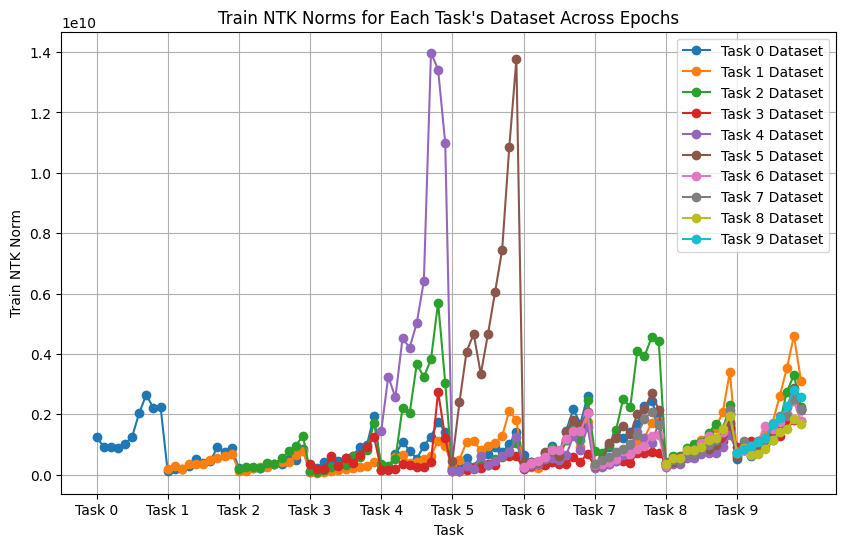

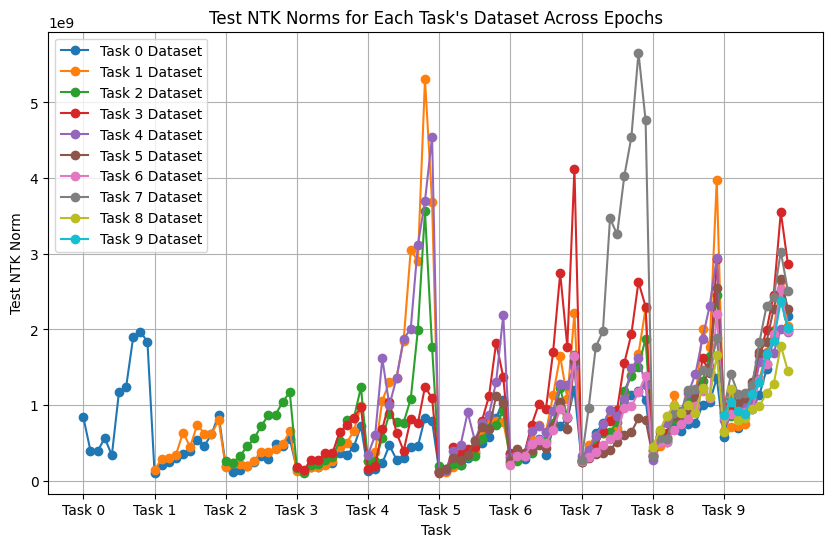

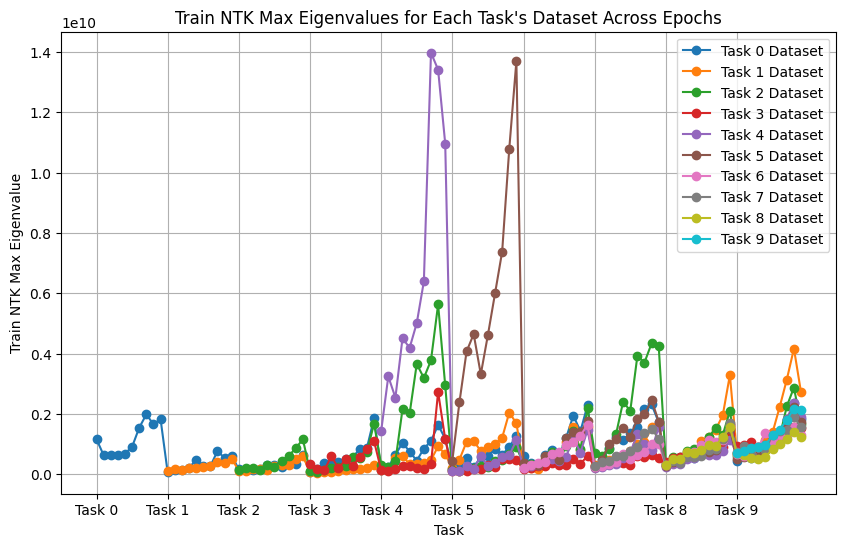

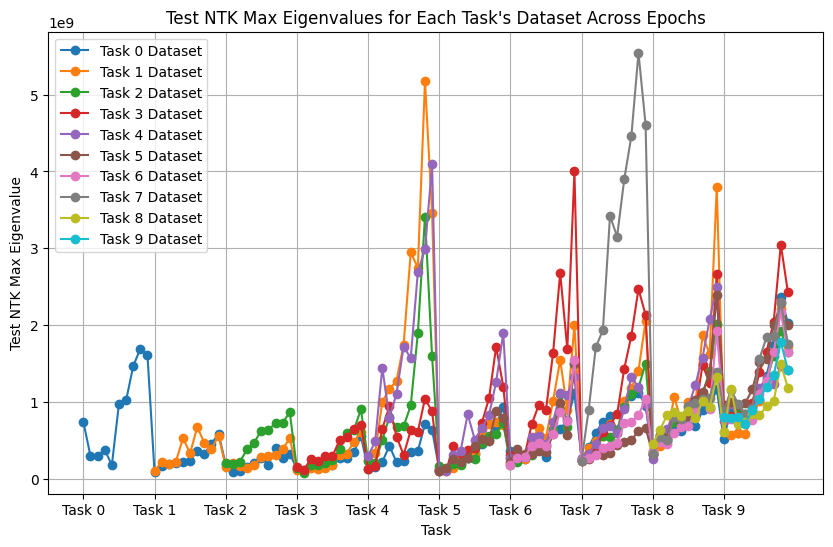

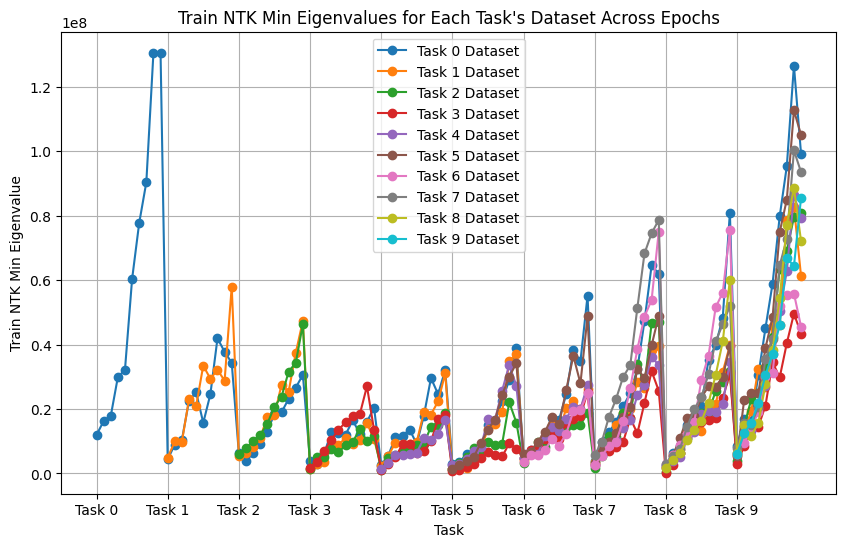

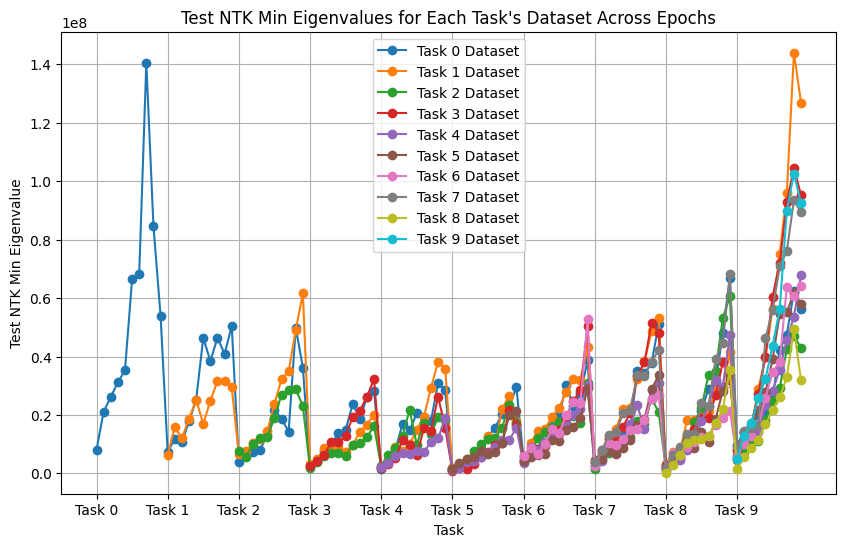

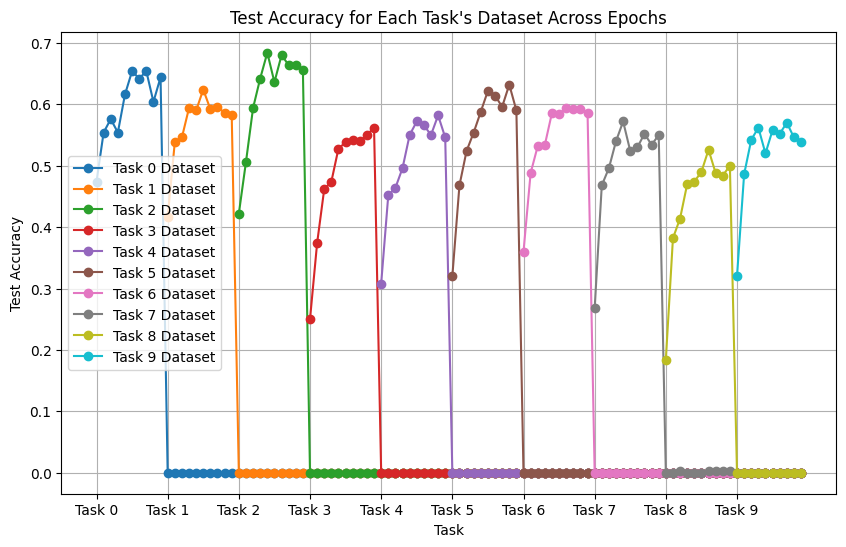


=== Task 1 ===
Epoch 1, Train Loss: 1.8412, Val Loss: 1.4897, Train Accuracy: 0.3758, Val Accuracy: 0.4900
Accuracy on Task 1 at Epoch 1: 0.4900
Epoch 2, Train Loss: 1.4402, Val Loss: 1.3610, Train Accuracy: 0.5153, Val Accuracy: 0.5360
Accuracy on Task 1 at Epoch 2: 0.5360
Epoch 3, Train Loss: 1.2199, Val Loss: 1.3002, Train Accuracy: 0.5887, Val Accuracy: 0.5660
Accuracy on Task 1 at Epoch 3: 0.5660
Epoch 4, Train Loss: 1.0347, Val Loss: 1.1424, Train Accuracy: 0.6538, Val Accuracy: 0.6280
Accuracy on Task 1 at Epoch 4: 0.6280
Epoch 5, Train Loss: 0.8472, Val Loss: 1.1697, Train Accuracy: 0.7153, Val Accuracy: 0.6380
Accuracy on Task 1 at Epoch 5: 0.6380
Epoch 6, Train Loss: 0.6640, Val Loss: 1.2297, Train Accuracy: 0.7793, Val Accuracy: 0.6240
Accuracy on Task 1 at Epoch 6: 0.6240
Epoch 7, Train Loss: 0.4845, Val Loss: 1.4396, Train Accuracy: 0.8324, Val Accuracy: 0.6100
Accuracy on Task 1 at Epoch 7: 0.6100
Epoch 8, Train Loss: 0.3962, Val Loss: 1.5555, Train Accuracy: 0.8649, Val

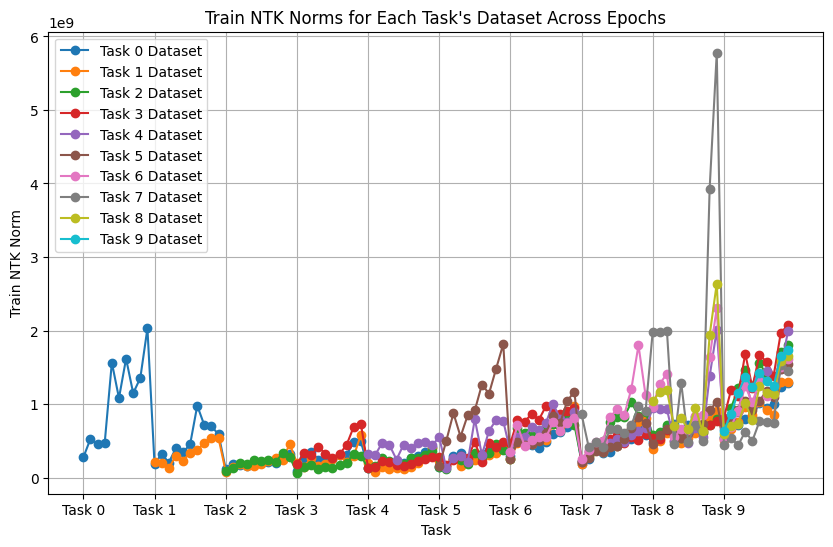

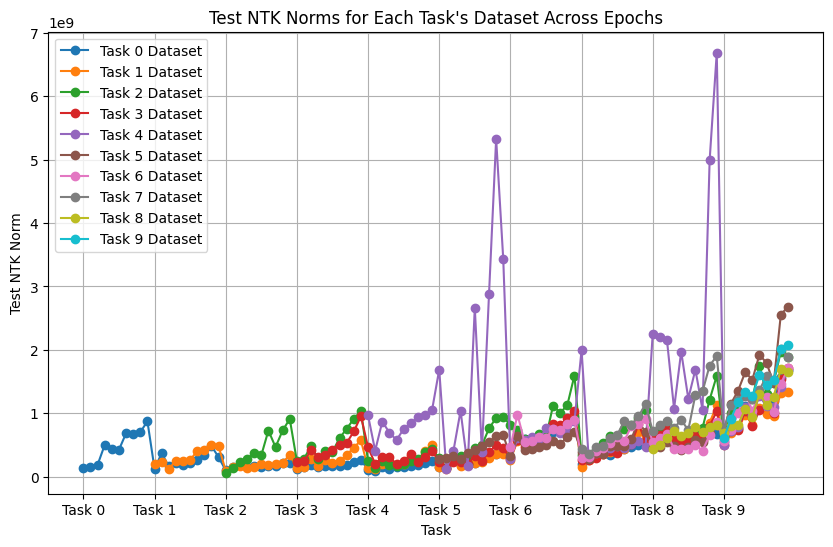

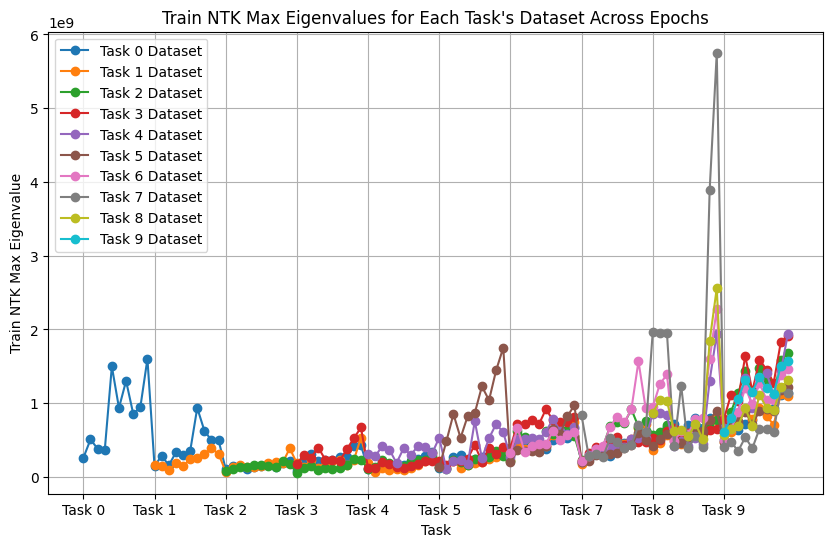

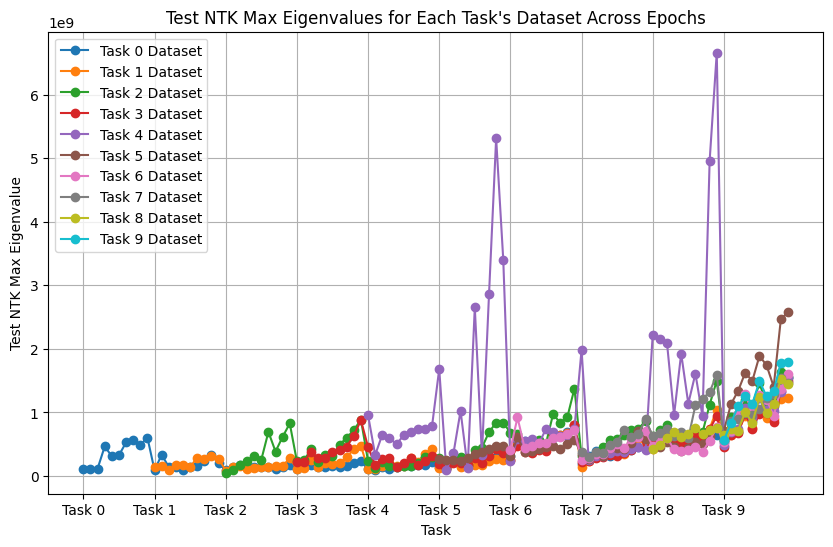

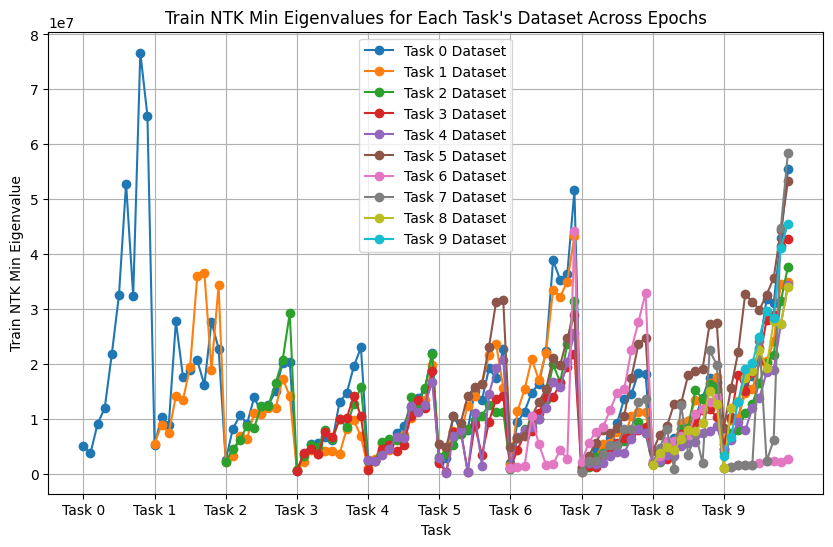

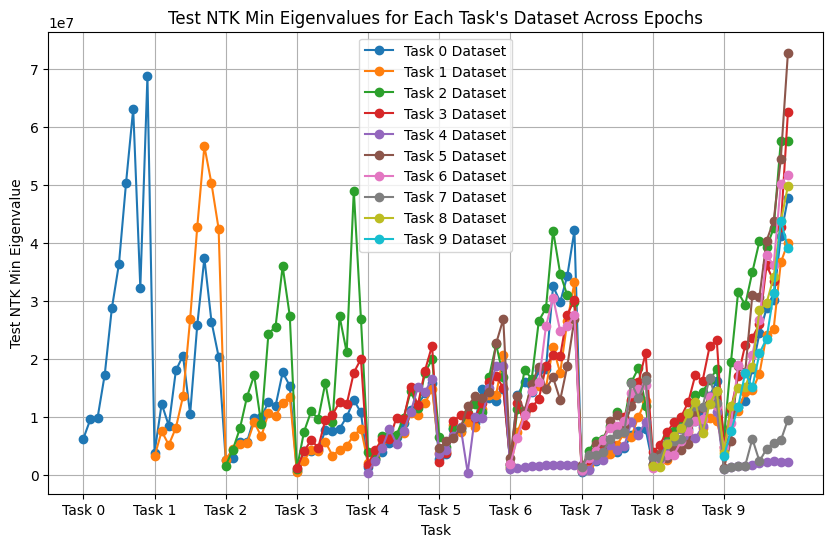

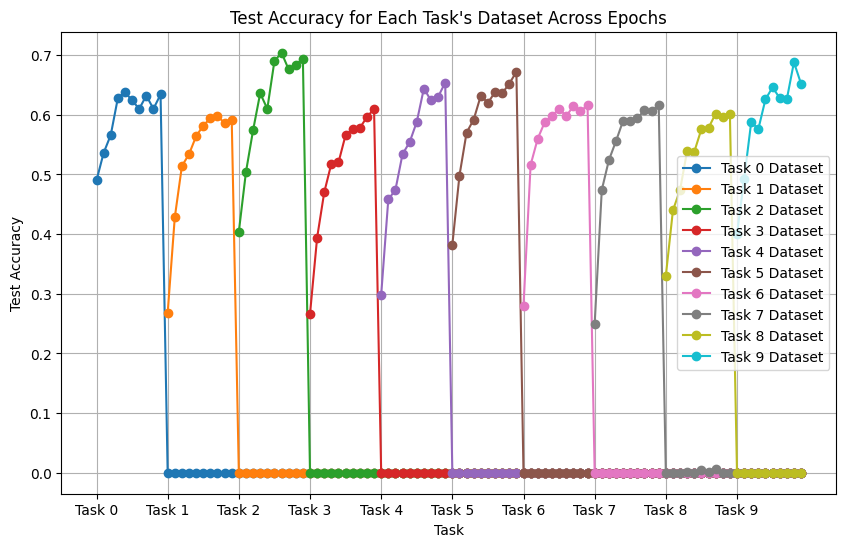


=== Task 1 ===
Epoch 1, Train Loss: 2.0131, Val Loss: 1.7499, Train Accuracy: 0.3324, Val Accuracy: 0.4260
Accuracy on Task 1 at Epoch 1: 0.4260
Epoch 2, Train Loss: 1.5187, Val Loss: 1.3730, Train Accuracy: 0.4776, Val Accuracy: 0.5600
Accuracy on Task 1 at Epoch 2: 0.5600
Epoch 3, Train Loss: 1.2771, Val Loss: 1.3587, Train Accuracy: 0.5609, Val Accuracy: 0.5520
Accuracy on Task 1 at Epoch 3: 0.5520
Epoch 4, Train Loss: 1.1303, Val Loss: 1.1485, Train Accuracy: 0.6171, Val Accuracy: 0.6080
Accuracy on Task 1 at Epoch 4: 0.6080
Epoch 5, Train Loss: 0.9398, Val Loss: 1.1432, Train Accuracy: 0.6847, Val Accuracy: 0.6120
Accuracy on Task 1 at Epoch 5: 0.6120
Epoch 6, Train Loss: 0.7771, Val Loss: 1.4459, Train Accuracy: 0.7344, Val Accuracy: 0.5600
Accuracy on Task 1 at Epoch 6: 0.5600
Epoch 7, Train Loss: 0.6437, Val Loss: 1.3082, Train Accuracy: 0.7816, Val Accuracy: 0.6140
Accuracy on Task 1 at Epoch 7: 0.6140
Epoch 8, Train Loss: 0.4617, Val Loss: 1.4365, Train Accuracy: 0.8482, Val

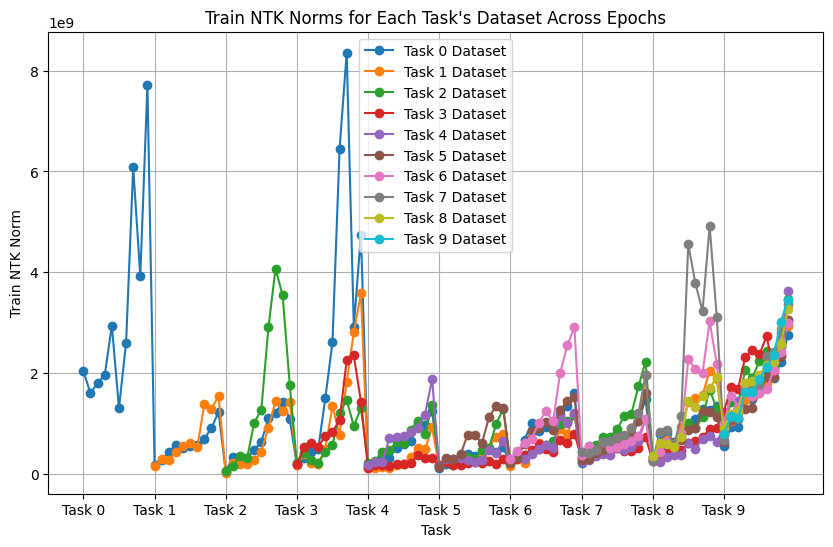

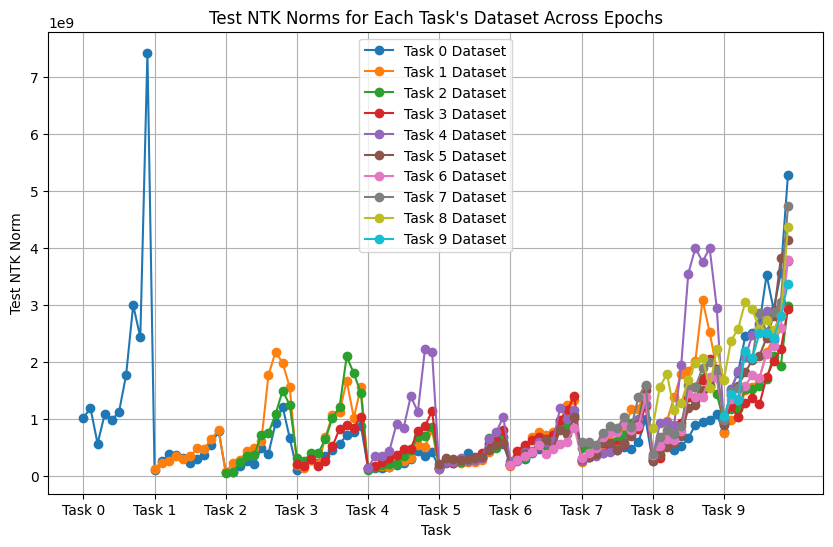

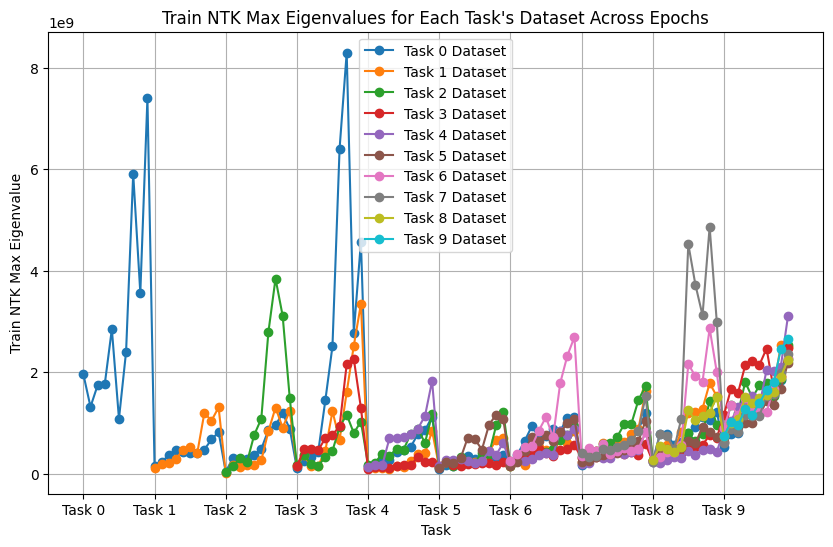

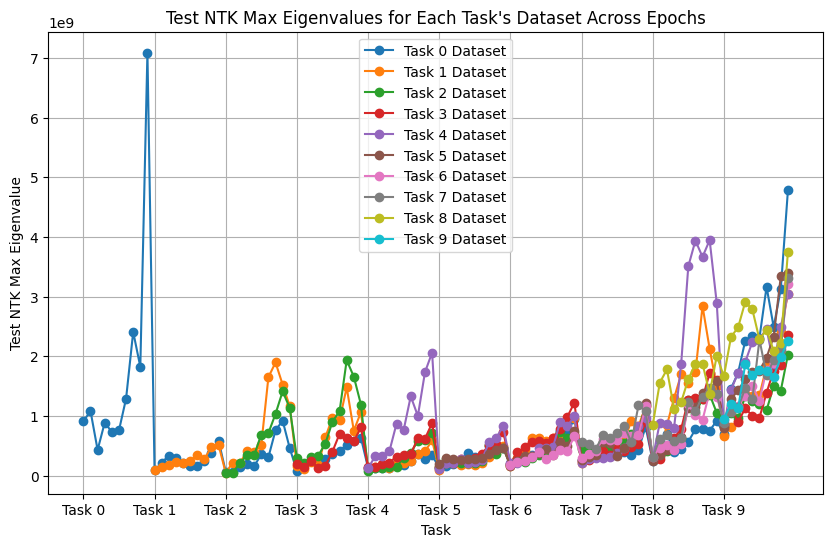

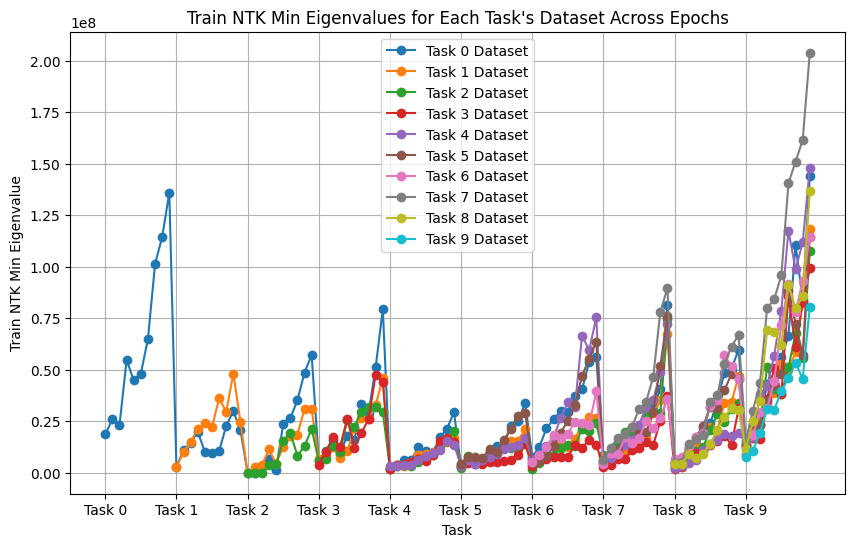

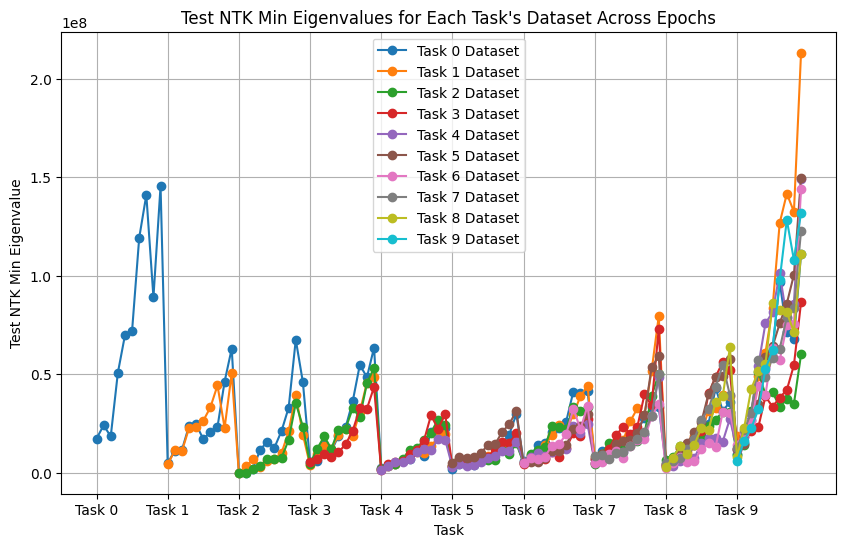

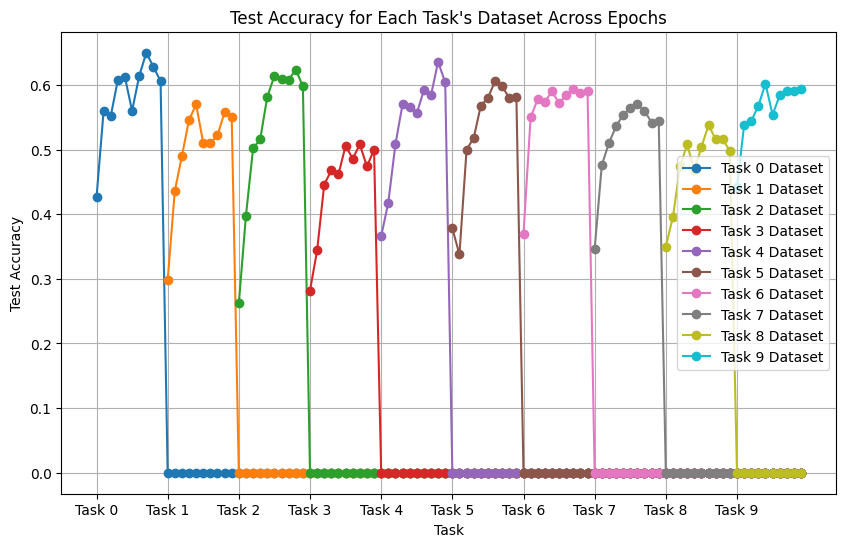


=== Task 1 ===
Epoch 1, Train Loss: 2.0849, Val Loss: 1.5762, Train Accuracy: 0.3287, Val Accuracy: 0.4700
Accuracy on Task 1 at Epoch 1: 0.4700
Epoch 2, Train Loss: 1.5881, Val Loss: 1.3670, Train Accuracy: 0.4449, Val Accuracy: 0.5520
Accuracy on Task 1 at Epoch 2: 0.5520
Epoch 3, Train Loss: 1.3633, Val Loss: 1.2469, Train Accuracy: 0.5367, Val Accuracy: 0.5880
Accuracy on Task 1 at Epoch 3: 0.5880
Epoch 4, Train Loss: 1.1936, Val Loss: 1.2289, Train Accuracy: 0.5938, Val Accuracy: 0.6180
Accuracy on Task 1 at Epoch 4: 0.6180
Epoch 5, Train Loss: 1.0383, Val Loss: 1.1367, Train Accuracy: 0.6482, Val Accuracy: 0.6160
Accuracy on Task 1 at Epoch 5: 0.6160
Epoch 6, Train Loss: 0.8656, Val Loss: 1.2322, Train Accuracy: 0.7096, Val Accuracy: 0.6060
Accuracy on Task 1 at Epoch 6: 0.6060
Epoch 7, Train Loss: 0.6467, Val Loss: 1.1670, Train Accuracy: 0.7842, Val Accuracy: 0.6480
Accuracy on Task 1 at Epoch 7: 0.6480
Epoch 8, Train Loss: 0.5017, Val Loss: 1.2604, Train Accuracy: 0.8356, Val

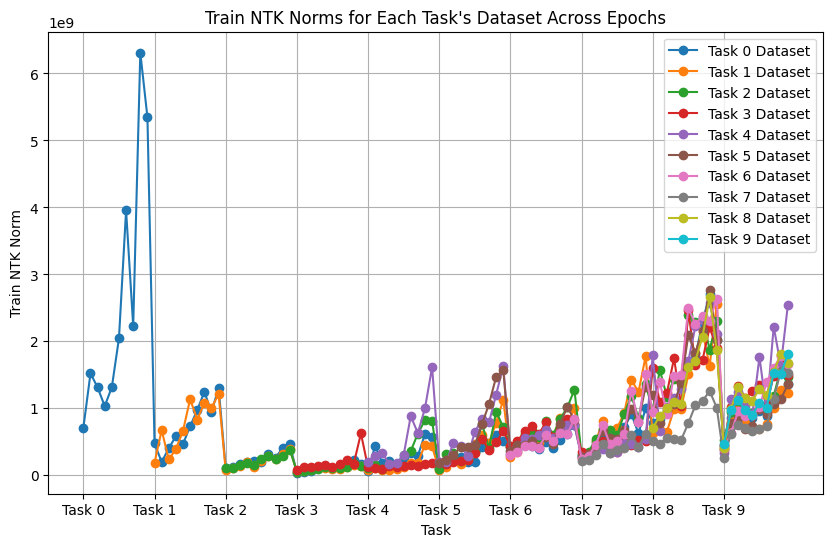

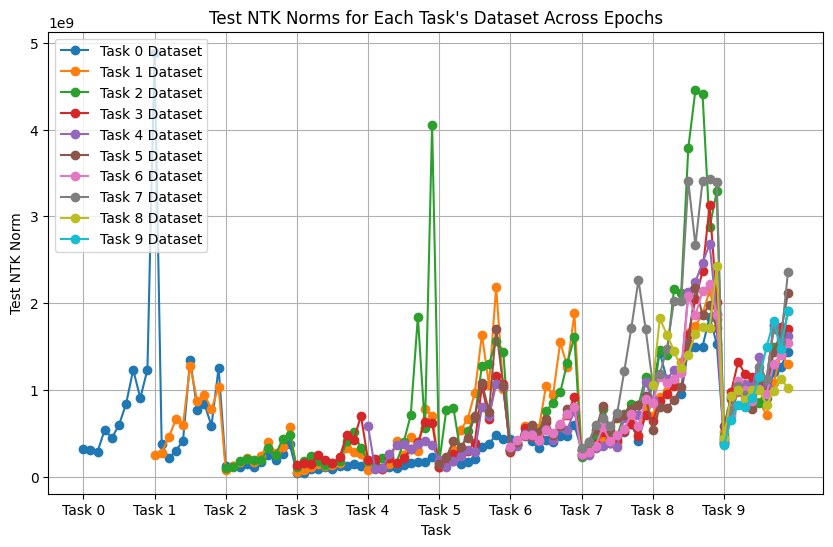

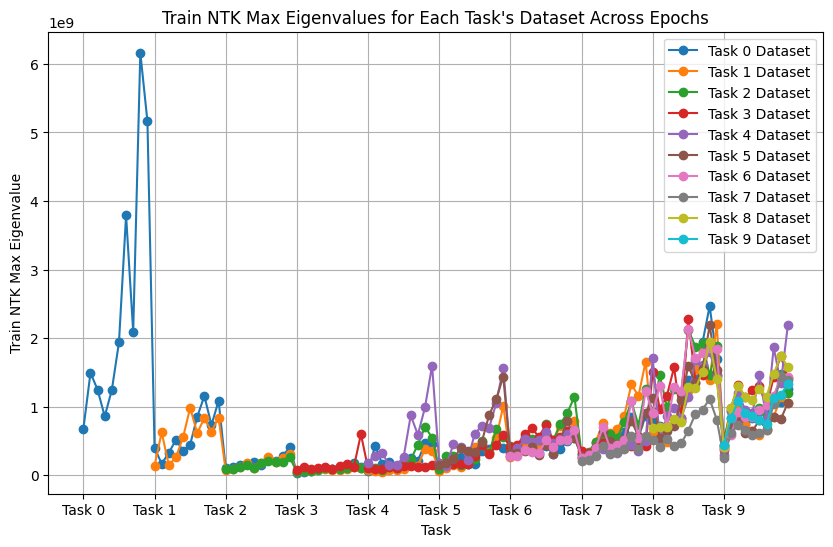

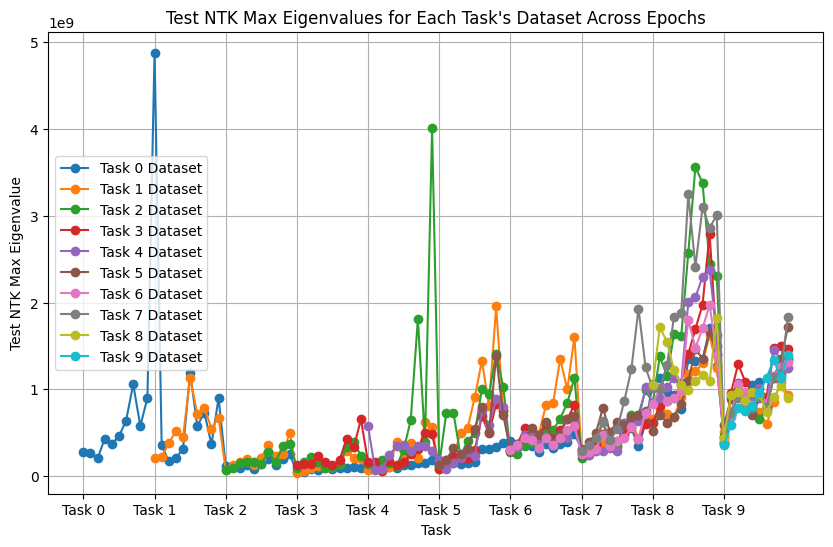

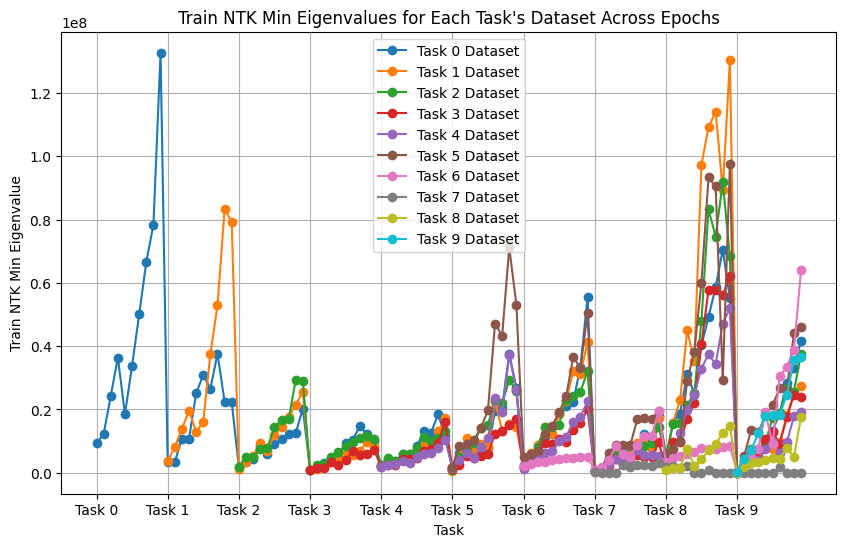

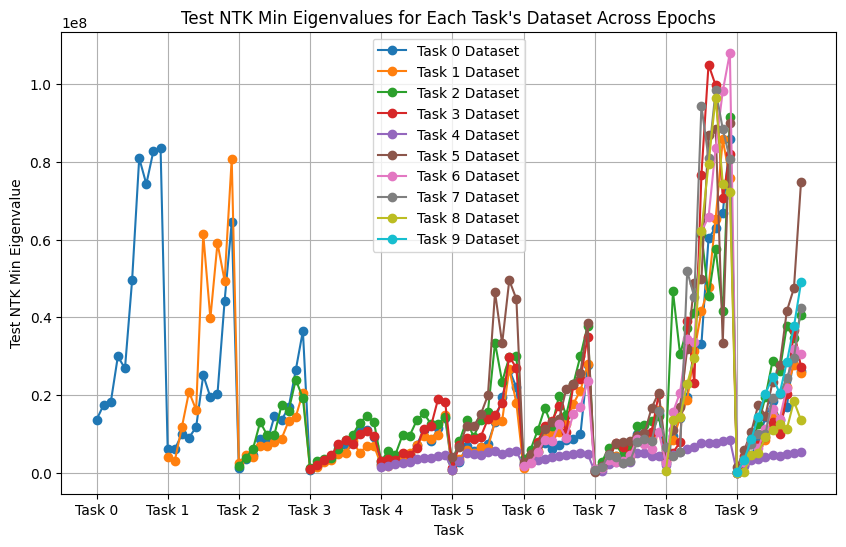

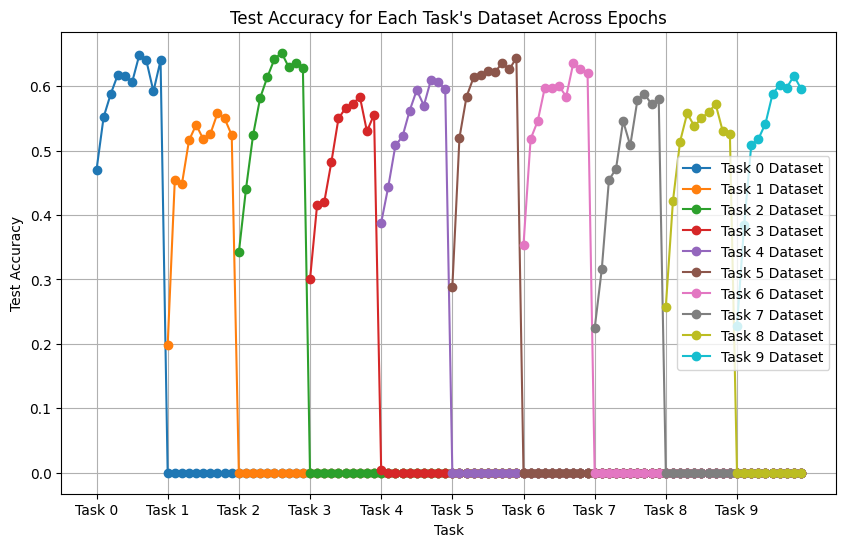

In [4]:
layer_sizes_list = [
    [3,1000,100,32],
    [3,1000,100,64],
    [3,5000,100,32],
    [3,5000,100,64],
]

metrics = {
    "CNN":{
        "CIFAR100": {
            "10-10-10": {
                "1000_32": {"train_ntk_matrices": None, "test_ntk_matrices": None, "task_accuracies": None},
                "1000_64": {"train_ntk_matrices": None, "test_ntk_matrices": None, "task_accuracies": None},
                "5000_32": {"train_ntk_matrices": None, "test_ntk_matrices": None, "task_accuracies": None},
                "5000_64": {"train_ntk_matrices": None, "test_ntk_matrices": None, "task_accuracies": None}
            }
        }
    }
}

for layer_sizes in layer_sizes_list:
    width = layer_sizes[1]  
    input_dim, hidden_dim, output_dim, channel = layer_sizes
    model = CNN(input_dim, hidden_dim, output_dim, channel ).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    epochs_per_task = 10

    train_ntk_matrices, test_ntk_matrices, task_accuracies = train_and_evaluate(model, epochs_per_task)

    metrics["CNN"]["CIFAR100"]["10-10-10"][str(width)] = {
        "train_ntk_matrices": train_ntk_matrices,
        "test_ntk_matrices": test_ntk_matrices,
        "task_accuracies": task_accuracies
    }
    
import pickle 
with open("cnn_cifar100_10_10_10epo_cuda.pkl", "wb") as file:
    pickle.dump(metrics, file)